# Linear and logistic regression fits for predicting behavior
#### This notebook fits linear and logistic regression on RIA,RIB,RIM neuronal activity levels and/or derivatives to predict four behaviors: Speed (Z-scored),velocity,velocity(Z-scored), and movement ratio. It can be used either for predicting current behaviors ('y'), behaviors one bin into future ('y_sh'), or behaviors 2 bins into future ('y_sh2')

## Options:
#### A1)training on the whole dataset of each worm and evauating on the same set for that worm or evaluating on other worms--> `Train=True`
#### A2)training on the `(1-ts)` of each worm's dataset and evauating on the rest of `ts` for that worm or evaluating on other worms--> `Train=False`. And repeating the test `cV` times for each worm for cross validation and getting error bars
#### B1) `behave_ind = True `: Having current behavior as an independent variable to predict future behavior (`y_sh` or `y_sh2`).In this case `indextV_der18` is the label and order of independent variables used for the fit.
#### B2) `behave_ind = False `: Only using neuronal activities or their derivative as independent variable to predict current or future behavior (`y`,`y_sh` ,or `y_sh2`). In this case `indextV_der17` is the label and order of independent variables used for the fit.
#### C1) `dep0='y_sh'` Predicting behavior 1 bin in the future. The code will copute performance in predicting all the 4 behaviors mentioned based on the independent variables which are different configurations of neuronal activities and their derivatives
#### C2) `dep0='y_sh2'` Predicting behavior 2 bins in the future. The rest is similar to C1.
#### C3) `dep0='y'` Predicting behavior in the current bin. The rest is similar to C1 but make sure to set `behave_ind = False ` in this option because including current behavior in the independent varaiable's set to predict current behavior doesn't make sense. 

# How it works?
#### The notebook has 5 main parts.
## 1) Import data: 
#### read the data from h5 file, smooth it, compute the derivatives of neuronal activities, and make the matrix that has both calcium level of neurons and their derivative and the behaviors
## 2) Bin data: 
#### Group neuronal activities, neuronal derivatives, and behavioral measures into time bins ranging from 2 to 60 seconds.
## 3) Train linear and logistic regression:
#### Train linear and logistic regression on 21 different combinations of RIA/RIB/RIM's neuronal activities and derivatives
## 4) Plot performance of regression models:
#### plots performance of fits over different set of independent variables for predicting 4 different behaviors. Plots average of R^2 with SEM for individual worms in case of A2 and the R^2 on training set in case of A1. Plots average R^2 with sem over all worms. You can choose the independent variables you want to plot by `alist` vector. if you are in B1 case choosing `alist = [1,2,21]` gives you plots for regression models trained on (activity level of RIB-RIM-RIA + behavior), (derivative of RIB-RIA-RIM + behavior), and (behavior) respctively.

## 5) Plot prediction of the model trained on one worm for behavior of other worms.

In [1]:
PF = False # whether to plot some of the linear regressions plots
behave_ind = False #choose behavior as an independent variable
Train=True # True: Train on the whole dataset of each worm and evaluate everything on the same set
ts = 0.3# a number between 0 and 1 which is the ratio of test set
dep0='y'#dependent variable to predict. 
cV=10# cross validation folds if you are evaluating of the test set different from training set

In [2]:
#corresponding variables name for each indext list

indextV_der17 = ['dRIM,dRIB,dRIA,RIM,RIB,RIA(L/R)','RIM,RIB,RIA(L/R)','dRIM,dRIB,dRIA(L/R)',
                 'dRIM,dRIB,dRIA,RIM,RIB,RIA(L)','dRIM,dRIB,dRIA,RIM,RIB,RIA(R)',
                 'dRIM,RIM,dRIB,RIB(L)','dRIM,RIM,dRIB,RIB(R)',
                 'RIM,RIB(L/R)','dRIM,dRIB(L/R)',
                 'dRIM(L)','dRIM(R)','dRIB(L)','dRIB(R)','RIML','RIMR','RIBL','RIBR','RIAL','RIAR','dRIA(L)','dRIA(R)']

indextV_der18 = ['dRIM,dRIB,dRIA,RIM,RIB,RIA(L/R)+B','RIM,RIB,RIA(L/R)+B','dRIM,dRIB,dRIA(L/R)+B',
                 'dRIM,dRIB,dRIA,RIM,RIB,RIA(L)+B','dRIM,dRIB,dRIA,RIM,RIB,RIA(R)+B',
                 'dRIM,RIM,dRIB,RIB(L)+B','dRIM,RIM,dRIB,RIB(R)+B',
                 'RIM,RIB(L/R)+B','dRIM,dRIB(L/R)+B',
                 'dRIM(L)+B','dRIM(R)+B','dRIB(L)+B','dRIB(R)+B','RIML+B','RIMR+B','RIBL+B','RIBR+B','RIAL+B','RIAR+B','dRIA(L)+B',
                 'dRIA(R)+B','B']

alist = [1,21]#range(13)#

In [3]:
import h5py
import numpy as np
import Functions.Binning as Bin
import Functions.Regressors as Rss
import copy
import importlib
import matplotlib.pyplot as plt
import Functions.AllFunctions as AllF
import Functions.Make_pandaBinsDataset as MPB
import pandas as pd
from scipy.signal import savgol_filter
import Functions.UnifyWormsFun as UNF
from scipy.signal import find_peaks
import Functions.Autocorr as Aut
from sklearn.metrics import mean_squared_error

/Users/mahsa/Documents/phd-thesis-code/Plotting


## 1) Import data: 
#### read the data from h5 file, smooth it, compute the derivatives of neuronal activities, and make the matrix that has both calcium level of neurons and their derivative and the behaviors

In [4]:
h5 = h5py.File('MegaData7_7worms_V6.h5', 'r')

In [6]:
L= h5['data_sets_info/lowercam_length']
MegaData0 = np.copy(h5['data/dataraw'])
MegaData =copy.deepcopy(MegaData0)
smooth=True
gapfilled = True
numW=7

In [7]:
#the upper camera in the  6th movie starts late
for i in range(55):
    if i >12 and not (i in [27,28,39,40]):
        MegaData[5,:243,i] = 0
        MegaData0[5,:243,i] = 0
        
for i in range(55):
    MegaData[6,L[6]:,i] = 0
    MegaData0[6,L[6]:,i] = 0

In [8]:
sm = [2,2,2,3,4,3,3]
g=[5,5,5,7,10,7,7]
sg=[5,5,5,7,11,7,7]
if smooth:
    for d in range(7):
        for i in range(55):
            if not (i in [10,11,12]):
                MegaData[d,:L[d],i] = Bin.smooth_vec_long(MegaData0[d,:L[d],i],sm[d],g[d])

MegaData_filled =copy.deepcopy(MegaData0)
importlib.reload(AllF)
if gapfilled:
    for d in range(7):
        for i in range(55):
            if not (i in [10,11,12]):
                MegaData_filled[d,:L[d],i] = AllF.fill_in_gaps(MegaData0[d,:L[d],i],g[d])

MegaData_fs =copy.deepcopy(MegaData0)
if smooth and gapfilled:
    for d in range(7):
        for i in range(55):
            if not (i in [10,11,12]):
                MegaData_fs[d,:L[d],i] = Bin.smooth_vec_long(MegaData_filled[d,:L[d],i],sm[d],g[d])

MegaData_filled[MegaData_filled==0] = np.nan
MegaData_interp = copy.deepcopy(MegaData_filled)
for d in range(numW):
    for n in range(55):
        if not (n in [10,11,12]):
            time = MegaData0[d,:L[d],12]
            values = MegaData_filled[d,:L[d],n]
            df = pd.DataFrame({'time': time, 'values': values})
            window_size = 3
            df['values2'] = df['values'].interpolate(method='linear')
            smoothed_values1 = savgol_filter(df['values2'], window_length=sg[d], polyorder=1)
            df['smoothed_values1'] = smoothed_values1
            MegaData_interp[d,:L[d],n] = smoothed_values1


MegaData_interp[np.isnan(MegaData_interp)]=0
MegaData_filled[np.isnan(MegaData_filled)]=0

In [9]:
# Obtain the data matrix that has neuron's derivatives
# derivative function converts zeros to nan, the output has zeros and no nans

Data0= copy.deepcopy(MegaData)
Data0[3,:,:] = MegaData_fs[3,:,:]
Data0[5,:,:] = MegaData_fs[5,:,:]
#derivatives computed over dt = 1.5s
Deriv = AllF.compute_derivatives(Data0,sm,L,ZscoreList=[0,1,2,3,4,5,6,7,8,9,27,28,39,40],exclude_worm=[7],
                            exclude_columns=[10,11,12,55,56,57,58,59])

# correct the time columns of the derivative data matrices
for r in [10,11,12]:
    Deriv[:,:,r] = MegaData0[:,:,r]

filtered_columns:
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54]


/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/AllFunctions.py:332: RuntimeWarning: Mean of empty slice
  mean = np.nanmean(vector[np.nonzero(vector)[0]])
/Users/mahsa/miniconda3/envs/Targettrack/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/AllFunctions.py:273: RuntimeWarning: All-NaN slice encountered
  maxpos = np.nanmax(temp)
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/AllFunctions.py:274: RuntimeWarning: All-NaN slice encountered
  maxneg = -np.nanmin(temp)


In [10]:
#add the nan values for proper speed thresholding
MegaData[MegaData==0]=np.nan
for r in [10,11,12]:
    MegaData[:,:,r] = MegaData0[:,:,r]
    MegaData[:,:,r] = MegaData0[:,:,r]

d: 0


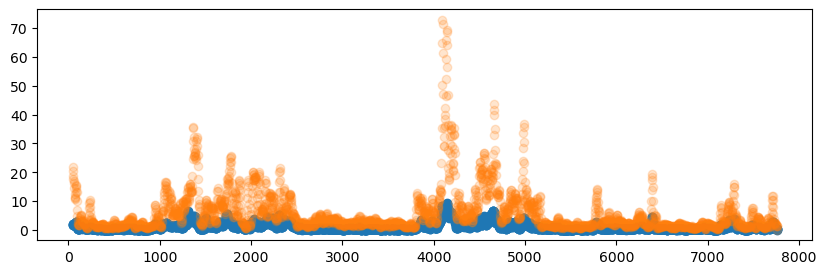

Head
d: 1


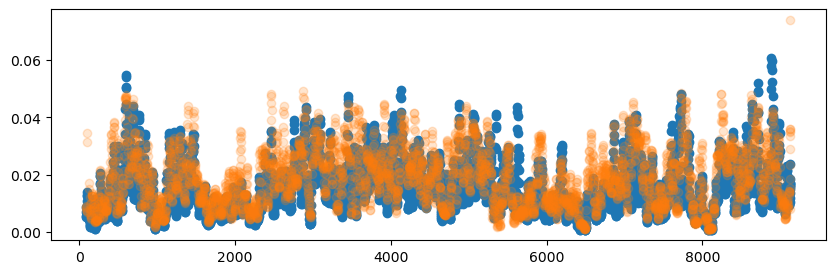

Head
d: 2


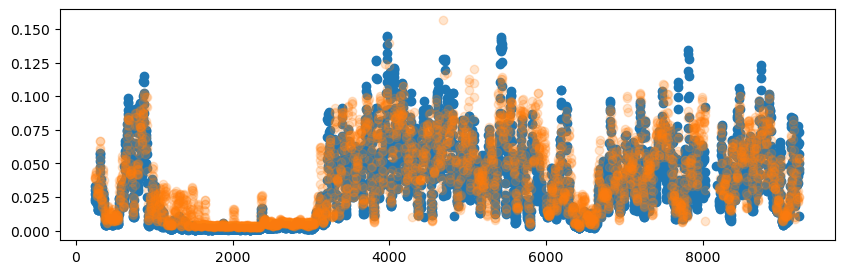

Head
d: 3


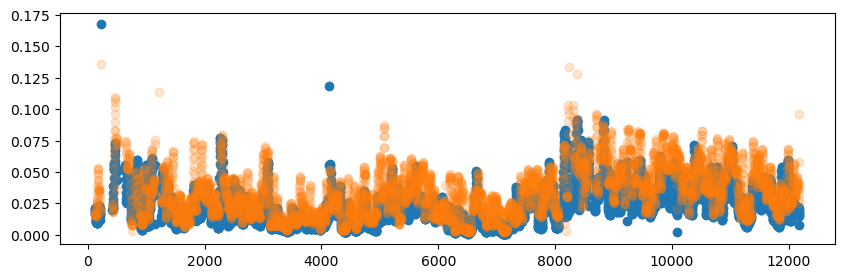

Head
d: 4


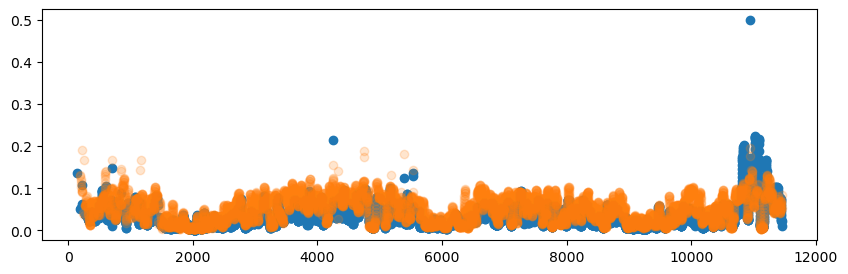

Head
d: 5


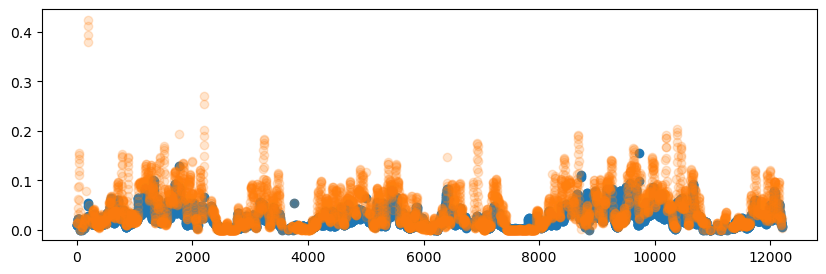

Head
d: 6


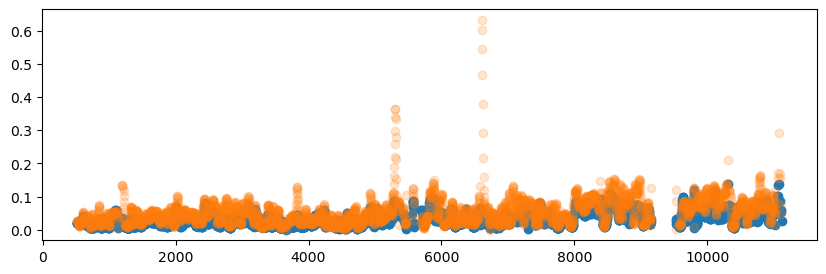

Head


In [11]:
#Define velocity threshold for forward and backward movement
#plot velocity of head
endW = 7
forward_vec= np.zeros((endW,8100))
Dorsal_vec = np.zeros((endW,8100))
ventral_vec = np.zeros((endW,8100))
backward_vec= np.zeros((endW,8100))
speed_vec= np.zeros((endW,8100))
turn_vec= np.zeros((endW,8100))
#pixel sizes if using V5
pix = [1, 0.001923, 0.002, 0.001923, 0.001923, 0.002222, 0.00196, 0.00185]

velchoice=16
forward_vec[np.isnan(MegaData[:numW,:,velchoice])] = np.nan
backward_vec[np.isnan(MegaData[:numW,:,velchoice])] = np.nan
speed_vec[np.isnan(MegaData[:numW,:,velchoice])] = np.nan



velchoice=16
thresh_bin0 = [0.06,6,6,12,10,12,12,12]
thresh_bin = [pix[w]*thresh_bin0[w] for w in range(numW)]
threshPos0 = [0.1,2.6,2,2.4,4.5,1.5,2,1]#[0.6,3.6,8.5,6.3,9.3,5.3]#based  on top 30 or 40percent percentile of V16
threshPos = [pix[w]*threshPos0[w] for w in range(numW)]
threshNeg0 =[-0.1,-1.6,-0.3,-1,-0.7,-0.5,-1.5,-1]#[-0.06,-2.6,-2.3,-2.5,-3.1,-2.9]#based on 30 percent of V16
threshNeg = [pix[w]*threshNeg0[w] for w in range(numW)]
speedthresh0 = [1,6,16,11,16,10,10,10]
speedthresh = [pix[w]*speedthresh0[w] for w in range(numW)]
head_thresh0 = [7,13,30,23,36,29,25,25]#based on 0.25 top percentie of velocity 25
head_thresh = [pix[w]*head_thresh0[w] for w in range(numW)]
for d in range(endW):
    print("d: "+str(d))
    rowsArr_float = copy.deepcopy(MegaData[d,:L[d],:])
    Vel5 = rowsArr_float[:,velchoice]
    Vel5sm = Bin.smooth_vec(rowsArr_float[:,velchoice])#dropbottom5perc(droptop5perc(rowsArr_float[:,velchoice],thresh=0.005),thresh=0.005)
    VelH = rowsArr_float[:,22]#dropbottom5perc(droptop5perc(rowsArr_float[:,22],thresh=0.01),thresh=0.01)
    fig = plt.figure(figsize=(10,3))
    ax = fig.add_subplot()
    VelMag = rowsArr_float[:,15]
    VelH_mag = rowsArr_float[:,25]
    ax.scatter(rowsArr_float[:,11],rowsArr_float[:,15])
    ax.scatter(rowsArr_float[:,11],VelH_mag,alpha=0.2 )

    plt.show()

    thet = rowsArr_float[:,46]#mid body angular velocity
    print("Head")
    forward_vec[d,:L[d]] = Vel5 > threshPos[d]
    backward_vec[d,:L[d]] = Vel5 < threshNeg[d]
    speed_vec[d,:L[d]] = VelMag > speedthresh[d]
    turn_vec[d,:L[d]]  = thet > 10 #moments where the worm takes a turn
    Dorsal_vec = VelH < - head_thresh[d]
    ventral_vec = VelH > head_thresh[d]

## 2) Bin data: 
#### Group neuronal activities, neuronal derivatives, and behavioral measures into time bins ranging from 2 to 60 seconds.

In [12]:
# define bins of different variables. and number of bins for each recording
m=1
max_neurons=13
neurons = [0,1,2,3,4,5,6,7,8,27,28,39,40]
thresh_bin = [0.6,6,6,12,10,12,12]
bin_coeff = [0.5,1,2,3,4,5,6,12,30]
y_labels = ['120','60', '30', '20', '15', '12', '10', '5','2']


In [13]:
#add the nan values for proper binning
MegaData[MegaData==0]=np.nan
for r in [10,11,12]:
    MegaData[:,:,r] = MegaData0[:,:,r]
    MegaData[:,:,r] = MegaData0[:,:,r]

Deriv[Deriv==0]=np.nan
for r in [10,11,12]:
    Deriv[:,:,r] = MegaData0[:,:,r]
    Deriv[:,:,r] = MegaData0[:,:,r]

In [14]:
# make the matrix of dataset of both activities of RIB,RIM,RIA and their derivative
MegaData_bin_mix = copy.deepcopy(MegaData)

MegaData_bin_mix[:,:,0] = Deriv[:,:,2]
MegaData_bin_mix[:,:,1] = Deriv[:,:,3]
MegaData_bin_mix[:,:,7] = Deriv[:,:,4]
MegaData_bin_mix[:,:,8] = Deriv[:,:,5]

MegaData_bin_mix[:,:,27] = copy.deepcopy(MegaData[:,:,0])
MegaData_bin_mix[:,:,28] = copy.deepcopy(MegaData[:,:,1])
MegaData_bin_mix[:,:,39] = Deriv[:,:,0]
MegaData_bin_mix[:,:,40] = Deriv[:,:,1]


In [17]:
## Mix of derivative of activity and acvity level bins
Bins_difftime_mix = {}
Corr_difftime_mix = {}
importlib.reload(Bin)
Bins_difftime_mixNan = {}
Corr_difftime_mixNan = {}
count2=0
for m0 in range(len(bin_coeff)) :
    m= bin_coeff[m0]
    b = [int(32*m),int(50*m),int(50*m),int(50*m),int(47*m),int(53*m),int(44*m)]
    AllCorr2,AllBins2 = Bin.Compute_binsWnans(MegaData_bin_mix,b,L,neurons,forward_vec,backward_vec,speed_vec,turn_vec,exceptt=1,except_data=[0])
    Bins_difftime_mixNan['bin_'+y_labels[count2]] = AllBins2
    Corr_difftime_mixNan['bin_'+y_labels[count2]] = AllCorr2

    AllCorrM,AllBinsM = Bin.Compute_bins(MegaData_bin_mix,b,L,neurons,forward_vec,backward_vec,speed_vec,turn_vec,exceptt=1,except_data=[0])
    Bins_difftime_mix['bin_'+y_labels[count2]] = AllBinsM
    Corr_difftime_mix['bin_'+y_labels[count2]] = AllCorrM
    count2=count2+1

****d*****1
****d*****2
****d*****3
****d*****4
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
****d*****5
****d*****6
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
****d*****1
****d*****2
****d*****3
****d*****4
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
no simultaneous data
****d*****5
****d*****6
no simultaneous data
no simultaneous 

## 3) Train linear and logistic regression:
#### Train linear and logistic regression on 21 different combinations of RIA/RIB/RIM's neuronal activities and derivatives

### Choose the dataset you want to regress
Choose which list of neurons and behaviors you want to choose for independent variables of the linear regression.
The list of variables should be a subset of ['x0','x1','x2', 'x3', 'x4', 'x5','x7','x8','x27','x28','x39','x40', 'y']
'y':behavior, 'xi': the variable (neuronal activity or the derivative) saved in the ith column of the 3rd axis of the data table (which similar to MegaData matrix)

In [18]:

# index_list in the last line is the final list of variables used for linear regression. sample of list of
#independent variables are listed here 



# use when you want to have bothe activities and derivatives anno behavior in independent variables
index_list17 = [
    pd.Index(['x0','x1','x2','x3', 'x4','x5','x7','x8','x27','x28','x39','x40'], dtype='object'),
    pd.Index(['x2','x3', 'x4','x5','x27','x28'], dtype='object'),#only activity RIA,RIB,RIM
    pd.Index(['x0','x1','x7','x8','x39','x40'], dtype='object'),#only derivative RIA,RIB,RIM
    pd.Index(['x0','x2','x4','x7','x27','x39'], dtype='object'),# RIA RIB RIM(L) activity and derivative
    pd.Index(['x1','x3','x5','x8','x28','x40'], dtype='object'),# RIB RIM(R) activity and derivative---n
    pd.Index(['x0','x2','x4','x7'], dtype='object'),# RIB RIM(L) activity and derivative
    pd.Index(['x1','x3','x5','x8'], dtype='object'),# RIB RIM(R) activity and derivative---n
    pd.Index(['x2','x3', 'x4','x5'], dtype='object'),#activityRIMRIB
    pd.Index(['x0','x1','x7','x8'], dtype='object'),#derivative RIMRIB
    pd.Index(['x0'], dtype='object'),#dRIML
    pd.Index(['x1'], dtype='object'),#dRIMR
    pd.Index(['x7'], dtype='object'),#dRIBL
    pd.Index(['x8'], dtype='object'),#dRIBR
    pd.Index(['x2'], dtype='object'),#RIML
    pd.Index(['x3'], dtype='object'),#RIMR
    pd.Index(['x4'], dtype='object'),#RIBL
    pd.Index(['x5'], dtype='object'),#RIBR
    pd.Index(['x27'], dtype='object'),#RIAL
    pd.Index(['x28'], dtype='object'),#RIAR
    pd.Index(['x39'], dtype='object'),#dRIAL
    pd.Index(['x40'], dtype='object')#dRIAR
    
]

# use when you want to have both activities and derivatives + behavior in independent variables
index_list18 = [
    pd.Index(['x0','x1','x2','x3', 'x4','x5','x7','x8','x27','x28','x39','x40','y'], dtype='object'),
    pd.Index(['x2','x3', 'x4','x5','x27','x28','y'], dtype='object'),#only activity RIA,RIB,RIM
    pd.Index(['x0','x1','x7','x8','x39','x40','y'], dtype='object'),#only derivative RIA,RIB,RIM
    pd.Index(['x0','x2','x4','x7','x27','x39','y'], dtype='object'),# RIA RIB RIM(L) activity and derivative
    pd.Index(['x1','x3','x5','x8','x28','x40','y'], dtype='object'),# RIB RIM(R) activity and derivative---n
    pd.Index(['x0','x2','x4','x7','y'], dtype='object'),# RIB RIM(L) activity and derivative
    pd.Index(['x1','x3','x5','x8','y'], dtype='object'),# RIB RIM(R) activity and derivative---n
    pd.Index(['x2','x3', 'x4','x5','y'], dtype='object'),#activityRIMRIB
    pd.Index(['x0','x1','x7','x8','y'], dtype='object'),#derivative RIMRIB
    pd.Index(['x0','y'], dtype='object'),#dRIML
    pd.Index(['x1','y'], dtype='object'),#dRIMR
    pd.Index(['x7','y'], dtype='object'),#dRIBL
    pd.Index(['x8','y'], dtype='object'),#dRIBR
    pd.Index(['x2','y'], dtype='object'),#RIML
    pd.Index(['x3','y'], dtype='object'),#RIMR
    pd.Index(['x4','y'], dtype='object'),#RIBL
    pd.Index(['x5','y'], dtype='object'),#RIBR
    pd.Index(['x27','y'], dtype='object'),#RIAL
    pd.Index(['x28','y'], dtype='object'),#RIAR
    pd.Index(['x39','y'], dtype='object'),#dRIAL
    pd.Index(['x40','y'], dtype='object'),#dRIAR
    pd.Index(['y'], dtype='object')#behavior
    
]

if behave_ind:
    index_list =index_list18
else:
    index_list =index_list17


In [19]:
numW=5
LenTests = len(index_list)
Max_len_dep = np.max([len(index_list[v]) for v in range(len(index_list))])

In [20]:
behav_size=4# how many different behaviors are fitted at the same time. usually it is speed, V1, V2, and binary moving state so 4 in total
LenTests = len(index_list)
Max_len_dep = np.max([len(index_list[v]) for v in range(len(index_list))])
# last indext is speed,velocity, and highspeed
Rsquare_acrossBins_self_av = np.zeros((len(bin_coeff),LenTests,numW,behav_size))
Rsquare_acrossBins_self_std = np.zeros((len(bin_coeff),LenTests,numW,behav_size))
Rsquare_acrossBins_self_max = np.zeros((len(bin_coeff),LenTests,numW,behav_size))
Coeff_acrossBins_self_max = np.zeros((len(bin_coeff),LenTests,numW,Max_len_dep+1,behav_size))
Coeff_acrossBins_self_av = np.zeros((len(bin_coeff),LenTests,numW,Max_len_dep+1,behav_size))

Rsquare_acrossBins_others_av = np.zeros((len(bin_coeff),LenTests,numW,behav_size))
Rsquare_acrossBins_others_std = np.zeros((len(bin_coeff),LenTests,numW,behav_size))
Rsquare_acrossBins_others_max = np.zeros((len(bin_coeff),LenTests,numW,behav_size))
Coeff_acrossBins_others_max = np.zeros((len(bin_coeff),LenTests,numW,Max_len_dep+1,behav_size))
Coeff_acrossBins_others_av = np.zeros((len(bin_coeff),LenTests,numW,Max_len_dep+1,behav_size))

pred_self_av = np.zeros((len(bin_coeff),numW,behav_size))
pred_self_max = np.zeros((len(bin_coeff),numW,behav_size))
Coeff_pred_self_max = np.zeros((len(bin_coeff),numW,Max_len_dep+1,behav_size))
pred_others_av = np.zeros((len(bin_coeff),numW,behav_size))
pred_others_max = np.zeros((len(bin_coeff),numW,behav_size))
Coeff_pred_others_max = np.zeros((len(bin_coeff),numW,Max_len_dep+1,behav_size))

In [21]:
Bins_difftime = copy.deepcopy(Bins_difftime_mixNan)
print('using Bins_difftime_mixNan')


using Bins_difftime_mixNan


************d6
************d6
indep_var: 12
['data1', 'data3', 'data4', 'data5', 'data6']
Index(['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x7', 'x8', 'x27', 'x28', 'x39',
       'x40'],
      dtype='object')
Index(['x2', 'x3', 'x4', 'x5', 'x27', 'x28'], dtype='object')
Index(['x0', 'x1', 'x7', 'x8', 'x39', 'x40'], dtype='object')
Index(['x0', 'x2', 'x4', 'x7', 'x27', 'x39'], dtype='object')
Index(['x1', 'x3', 'x5', 'x8', 'x28', 'x40'], dtype='object')
Index(['x0', 'x2', 'x4', 'x7'], dtype='object')
Index(['x1', 'x3', 'x5', 'x8'], dtype='object')
Index(['x2', 'x3', 'x4', 'x5'], dtype='object')
Index(['x0', 'x1', 'x7', 'x8'], dtype='object')
Index(['x0'], dtype='object')
Index(['x1'], dtype='object')
Index(['x7'], dtype='object')
Index(['x8'], dtype='object')
Index(['x2'], dtype='object')
Index(['x3'], dtype='object')
Index(['x4'], dtype='object')
Index(['x5'], dtype='object')
Index(['x27'], dtype='object')
Index(['x28'], dtype='object')
Index(['x39'], dtype='object')
Index(['x40'], dtype='ob

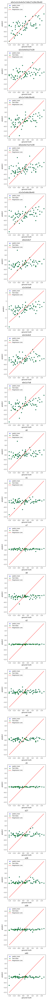

indep_var: 12
['data1', 'data3', 'data4', 'data5', 'data6']
Index(['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x7', 'x8', 'x27', 'x28', 'x39',
       'x40'],
      dtype='object')
Index(['x2', 'x3', 'x4', 'x5', 'x27', 'x28'], dtype='object')
Index(['x0', 'x1', 'x7', 'x8', 'x39', 'x40'], dtype='object')
Index(['x0', 'x2', 'x4', 'x7', 'x27', 'x39'], dtype='object')
Index(['x1', 'x3', 'x5', 'x8', 'x28', 'x40'], dtype='object')
Index(['x0', 'x2', 'x4', 'x7'], dtype='object')
Index(['x1', 'x3', 'x5', 'x8'], dtype='object')
Index(['x2', 'x3', 'x4', 'x5'], dtype='object')
Index(['x0', 'x1', 'x7', 'x8'], dtype='object')
Index(['x0'], dtype='object')
Index(['x1'], dtype='object')
Index(['x7'], dtype='object')
Index(['x8'], dtype='object')
Index(['x2'], dtype='object')
Index(['x3'], dtype='object')
Index(['x4'], dtype='object')
Index(['x5'], dtype='object')
Index(['x27'], dtype='object')
Index(['x28'], dtype='object')
Index(['x39'], dtype='object')
Index(['x40'], dtype='object')


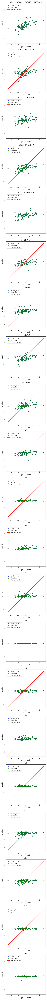

indep_var: 12
['data1', 'data3', 'data4', 'data5', 'data6']
Index(['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x7', 'x8', 'x27', 'x28', 'x39',
       'x40'],
      dtype='object')
Index(['x2', 'x3', 'x4', 'x5', 'x27', 'x28'], dtype='object')
Index(['x0', 'x1', 'x7', 'x8', 'x39', 'x40'], dtype='object')
Index(['x0', 'x2', 'x4', 'x7', 'x27', 'x39'], dtype='object')
Index(['x1', 'x3', 'x5', 'x8', 'x28', 'x40'], dtype='object')
Index(['x0', 'x2', 'x4', 'x7'], dtype='object')
Index(['x1', 'x3', 'x5', 'x8'], dtype='object')
Index(['x2', 'x3', 'x4', 'x5'], dtype='object')
Index(['x0', 'x1', 'x7', 'x8'], dtype='object')
Index(['x0'], dtype='object')
Index(['x1'], dtype='object')
Index(['x7'], dtype='object')
Index(['x8'], dtype='object')
Index(['x2'], dtype='object')
Index(['x3'], dtype='object')
Index(['x4'], dtype='object')
Index(['x5'], dtype='object')
Index(['x27'], dtype='object')
Index(['x28'], dtype='object')
Index(['x39'], dtype='object')
Index(['x40'], dtype='object')


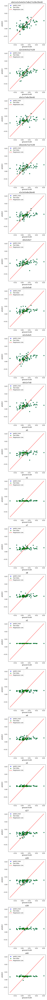

indep_var: 12
['data1', 'data3', 'data4', 'data5', 'data6']
applying logistic regression
applying logistic regression
applying logistic regression
applying logistic regression
applying logistic regression
Index(['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x7', 'x8', 'x27', 'x28', 'x39',
       'x40'],
      dtype='object')
applying logistic regression
applying logistic regression
applying logistic regression
applying logistic regression
applying logistic regression
Index(['x2', 'x3', 'x4', 'x5', 'x27', 'x28'], dtype='object')
applying logistic regression
applying logistic regression
applying logistic regression
applying logistic regression
applying logistic regression
Index(['x0', 'x1', 'x7', 'x8', 'x39', 'x40'], dtype='object')
applying logistic regression
applying logistic regression
applying logistic regression
applying logistic regression
applying logistic regression
Index(['x0', 'x2', 'x4', 'x7', 'x27', 'x39'], dtype='object')
applying logistic regression
applying logistic regression
app

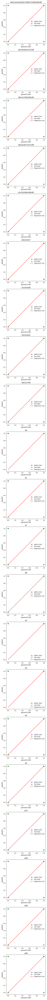

************d6
************d6
indep_var: 12
['data1', 'data3', 'data4', 'data5', 'data6']
Index(['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x7', 'x8', 'x27', 'x28', 'x39',
       'x40'],
      dtype='object')
Index(['x2', 'x3', 'x4', 'x5', 'x27', 'x28'], dtype='object')
Index(['x0', 'x1', 'x7', 'x8', 'x39', 'x40'], dtype='object')
Index(['x0', 'x2', 'x4', 'x7', 'x27', 'x39'], dtype='object')
Index(['x1', 'x3', 'x5', 'x8', 'x28', 'x40'], dtype='object')
Index(['x0', 'x2', 'x4', 'x7'], dtype='object')
Index(['x1', 'x3', 'x5', 'x8'], dtype='object')
Index(['x2', 'x3', 'x4', 'x5'], dtype='object')
Index(['x0', 'x1', 'x7', 'x8'], dtype='object')
Index(['x0'], dtype='object')
Index(['x1'], dtype='object')
Index(['x7'], dtype='object')
Index(['x8'], dtype='object')
Index(['x2'], dtype='object')
Index(['x3'], dtype='object')
Index(['x4'], dtype='object')
Index(['x5'], dtype='object')
Index(['x27'], dtype='object')
Index(['x28'], dtype='object')
Index(['x39'], dtype='object')
Index(['x40'], dtype='ob

In [80]:

countbin=2
countbin0 = countbin
binList = list(Bins_difftime.keys())
binListFinal = binList[countbin:]
for bin_s in binListFinal:    
    m= bin_coeff[countbin]
    b = [int(32*m),int(50*m),int(50*m),int(50*m),int(47*m),int(53*m),int(44*m)]
    bin_size = bin_s
    time_bins = Bins_difftime[bin_size]['time']
    Velocity_bins = Bins_difftime[bin_size]['Velocity_long']
    width_bins = Bins_difftime[bin_size]['width']
    activity_bins = Bins_difftime[bin_size]['activity']
    speed_bins = Bins_difftime[bin_size]['Speed_long']
    Acceleration_bins = Bins_difftime[bin_size]['Acceleration']
    Theta_bins = Bins_difftime[bin_size]['Theta']
    Turn_bins = Bins_difftime[bin_size]['Turn']
    Curve_bins = Bins_difftime[bin_size]['Curve']
    ForwardVel_bins = Bins_difftime[bin_size]['ForwardVel']
    BackwardVel_bins = Bins_difftime[bin_size]['BackwardVel']
    ForwardFreq_bins = Bins_difftime[bin_size]['ForwardFreq']
    BackwardFreq_bins = Bins_difftime[bin_size]['BackwardFreq']
    highspeed_bins = Bins_difftime[bin_size]['highspeed']# binary state
    odor_bins = Bins_difftime[bin_size]['Odor']
    #behavioral variables that are fitted:
    behavior_bins1 = BackwardFreq_bins#speed_bins#BackwardFreq_bins + ForwardFreq_bins#
    behavior_bins2 = Velocity_bins
    behavior_bins3 = highspeed_bins
    
    dataAll_s = MPB.make_Dataset_ZscoreAll(activity_bins,time_bins,behavior_bins1,odor_bins,b,except_data=[100],bins=True,sm=sm)
    dataAll_v1 = MPB.make_Dataset_ZscoreAll(activity_bins,time_bins,behavior_bins2,odor_bins,b,except_data=[100],bins=True,sm=sm)
    dataAll_v2 = MPB.make_Dataset_ZscoreActivity(activity_bins,time_bins,behavior_bins2,odor_bins,b,except_data=[100],bins=True,sm=sm)
    dataAll_hs = MPB.make_Dataset_ZscoreActivity(activity_bins,time_bins,behavior_bins3,odor_bins,b,except_data=[100],bins=True,sm=sm,logistic=True)
    # choose nonzero columns so that all the dependent and independent variables are nonzerol
    nonz_columns = [ 'x0','x1','x2','x3', 'x4','x5', 'y','x7','x8','x27','x28','x39','x40','y_sh']#,'y_sh','y_sh2']  
    nonz_columns_hs = [ 'x0','x1','x2','x3', 'x4','x5','x7','x8','x27','x28','x39','x40']#,'x7','x8']  
    # filter dataset to include only nonzero valid points
    filtered_dataAll_s= MPB.Dataset_filtered_0andNans(dataAll_s,nonzero_columns=nonz_columns,exceptional2=True)
    filtered_dataAll_v1= MPB.Dataset_filtered_0andNans(dataAll_v1,nonzero_columns=nonz_columns,exceptional2=True)
    filtered_dataAll_v2= MPB.Dataset_filtered_0andNans(dataAll_v2,nonzero_columns=nonz_columns,exceptional2=True)
    filtered_dataAll_hs= MPB.Dataset_filtered_0andNans(dataAll_hs,nonzero_columns=nonz_columns_hs,exceptional2=True)
    # choose the worms you want for linear regression and filter datasets on those worms only
    keys_to_include = ['data1', 'data3', 'data4', 'data5', 'data6']
    filtered_data_dict_s = {key: filtered_dataAll_s[key] for key in keys_to_include}
    filtered_data_dict_v1 = {key: filtered_dataAll_v1[key] for key in keys_to_include}
    filtered_data_dict_v2 = {key: filtered_dataAll_v2[key] for key in keys_to_include}
    filtered_data_dict_hs = {key: filtered_dataAll_hs[key] for key in keys_to_include}
    
    filtered_dataAlls= copy.deepcopy(filtered_data_dict_s)
    filtered_dataAllv1= copy.deepcopy(filtered_data_dict_v1)
    filtered_dataAllv2= copy.deepcopy(filtered_data_dict_v2)
    filtered_dataAllhs= copy.deepcopy(filtered_data_dict_hs)
    if countbin<3:
        PF=True
    else:
        PF=False
    #compute R^2 and coefficients after fitting linear or logistic regression to the for behavioral measures above
    if Train:    
        Rsqrtcombo_s, msqrEcombo_s, coeffcombo_s,combinations_of_combo_s = Rss.regress_neuron_knowncombo(filtered_dataAlls,index_list,
                                                                                  dep=dep0,crossVal=1,plotFig=PF,testsize=0)
        Rsqrtcombo_v1, msqrEcombo_v1, coeffcombo_v1,combinations_of_combo_v1 = Rss.regress_neuron_knowncombo(filtered_dataAllv1,index_list,
                                                                                  dep=dep0,crossVal=1,plotFig=PF,testsize=0)
        Rsqrtcombo_v2, msqrEcombo_v2, coeffcombo_v2,combinations_of_combo_v2 = Rss.regress_neuron_knowncombo(filtered_dataAllv2,index_list,
                                                                                  dep=dep0,crossVal=1,plotFig=PF,testsize=0)
        Rsqrtcombo_hs, msqrEcombo_hs, coeffcombo_hs,combinations_of_combo_hs = Rss.regress_neuron_knowncombo_logistic(filtered_dataAllhs,index_list,
                                                                                  dep=dep0,crossVal=1,plotFig=PF,testsize=0)
    else:
        Rsqrtcombo_s, msqrEcombo_s, coeffcombo_s,combinations_of_combo_s = Rss.regress_neuron_knowncombo_testeval(filtered_dataAlls,index_list,
                                                                              dep=dep0,crossVal=cV,plotFig=PF,testsize=ts)
        Rsqrtcombo_v1, msqrEcombo_v1, coeffcombo_v1,combinations_of_combo_v1 = Rss.regress_neuron_knowncombo_testeval(filtered_dataAllv1,index_list,
                                                                                  dep=dep0,crossVal=cV,plotFig=PF,testsize=ts)
        Rsqrtcombo_v2, msqrEcombo_v2, coeffcombo_v2,combinations_of_combo_v2 = Rss.regress_neuron_knowncombo_testeval(filtered_dataAllv2,index_list,
                                                                                  dep=dep0,crossVal=cV,plotFig=PF,testsize=ts)
        Rsqrtcombo_hs, msqrEcombo_hs, coeffcombo_hs,combinations_of_combo_hs = Rss.regress_neuron_knowncombo_testeval_logistic(filtered_dataAllhs,index_list,
                                                                                  dep=dep0,crossVal=cV,plotFig=PF,testsize=ts)
    # save the average and maximum R^2 for each behavioral measures fit in the current bin size
    for t in range(4):
        if t==0:
            Rsqrtcombo = copy.deepcopy(Rsqrtcombo_s) 
            coeffcombo = copy.deepcopy(coeffcombo_s)
        if t==1:  
            Rsqrtcombo = copy.deepcopy(Rsqrtcombo_v1)
            coeffcombo = copy.deepcopy(coeffcombo_v1)
        if t==2:
            Rsqrtcombo = copy.deepcopy(Rsqrtcombo_v2) 
            coeffcombo = copy.deepcopy(coeffcombo_v2)
        if t==3:
            Rsqrtcombo = copy.deepcopy(Rsqrtcombo_hs) 
            coeffcombo = copy.deepcopy(coeffcombo_hs)
            

        for d in range(numW):
            Rsquare_acrossBins_self_av[countbin,:,d,t] = np.nanmean(Rsqrtcombo[:,d,d,:],axis=1)
            Rsquare_acrossBins_self_std[countbin,:,d,t] = np.std(Rsqrtcombo[:,d,d,:],axis=1)
            Rsquare_acrossBins_self_max[countbin,:,d,t] = np.max(Rsqrtcombo[:,d,d,:],axis=1)
            pred_self_av[countbin,d,t] = np.mean(Rsqrtcombo[0,d,d,:]-Rsqrtcombo[2,d,d,:])
            pred_self_max[countbin,d,t] = np.max(Rsqrtcombo[0,d,d,:]-Rsqrtcombo[2,d,d,:])
            max_ind_p = np.argmax(Rsqrtcombo[0,d,d,:]-Rsqrtcombo[2,d,d,:])
            Coeff_pred_self_max[countbin,d,:,t] = coeffcombo[0,d,max_ind_p,:]
            max_ind = np.argmax(Rsqrtcombo[:,d,d,:],axis=1)
            for k in range(len(max_ind)):            
                Coeff_acrossBins_self_max[countbin,k,d,:,t] = coeffcombo[k,d,max_ind[k],:]
            Coeff_acrossBins_self_av[countbin,:,d,:,t] = np.nanmean(coeffcombo[:,d,:,:],axis=1)
            Rsqrt = copy.deepcopy(Rsqrtcombo)
            Rsq = np.nanmean(np.delete(Rsqrt[:,d,:,:],[d],axis=1),axis=1)#mean of Rsq on all other worms except itself [d,1]
            Rsquare_acrossBins_others_av[countbin,:,d,t] = np.nanmean(Rsq,axis=1)
            pred_others_av[countbin,d,t] = np.mean(Rsq[0]-Rsq[2])
            pred_others_max[countbin,d,t] = np.max(Rsq[0]-Rsq[2])
            
            max_ind_po = np.argmax(Rsq[0]-Rsq[2])
            Coeff_pred_others_max[countbin,d,:,t] = coeffcombo[0,d,max_ind_po,:]
            
            Rsquare_acrossBins_others_std[countbin,:,d,t] = np.nanstd(Rsq,axis=1)
            Rsquare_acrossBins_others_max[countbin,:,d,t] = np.nanmax(Rsq,axis=1)
            max_ind_c = np.argmax(Rsq,axis=1)
            for k in range(len(max_ind_c)):            
                Coeff_acrossBins_others_max[countbin,k,d,:,t] = coeffcombo[k,d,max_ind_c[k],:]
    countbin=countbin+1    

        


## 4) Plot performance of regression models:
#### plots performance of fits over different set of independent variables for predicting 4 different behaviors. Plots average of R^2 with SEM for individual worms in case of A2 and the R^2 on training set in case of A1. Plots average R^2 with sem over all worms. You can choose the independent variables you want to plot by `alist` vector. if you are in B1 case choosing `alist = [1,2,21]` gives you plots for regression models trained on (activity level of RIB-RIM-RIA + behavior), (derivative of RIB-RIA-RIM + behavior), and (behavior) respctively.

### Functions needed for plotting

In [62]:
#functions for plotting resullts
def normalize_coeff(matrix):
    output = matrix / np.abs(matrix).max(axis=1, keepdims=True)
    return output

def plot_each_wormRsqr(y_labels0 , start_bin,Rsquare_av,Rsquare_std,indextV_01, a_range = range(6),titre='self Speed RT, Worm '):
    fig, axes = plt.subplots(nrows=numW, ncols=1, figsize=(8, 4*numW-2), sharex=True)
    rows = y_labels0[start_bin:]
    for d in range(numW):
        ax=axes[d]
        for a in a_range:
            row_means = Rsquare_av[start_bin:,a,d]
            row_sems0 = Rsquare_std[start_bin:,a,d]
            row_sems = row_sems0/np.sqrt(np.sum(~(row_sems0==0)))
            
            axes[d].errorbar(rows, row_means, yerr=row_sems, fmt='o-', capsize=5, label=indextV_01[a],lw=2)
        ax.set_xticks(rows,labels=y_labels0[start_bin:],fontsize=fs)  # Set custom x labels with font size
        ax.tick_params(axis='y', labelsize=fs) 
        #ax.set_ylim(bottom = 0)
        ax.set_ylim(bottom =  np.max([np.min(Rsquare_av[start_bin:,:,d]), 0]))#,top=0.2)
        ax.set_title(titre +str(d+1), fontsize=fs)
        ax.grid(True)
    ax.legend(ncol=2, loc='best', borderaxespad=0.5)
    ax.invert_xaxis()     
    fig.tight_layout(rect=[0, 0, 0.85, 1]) 
    plt.show()
    return fig

def plot_averagedWorm_acrossbins(y_labels0,start_bin,R_choice,indextV_01, a_range = range(6),titre='average worms'):
    fig = plt.figure(figsize=(8, 4))
    rows = y_labels0
    for a in a_range:
        row_means_o = np.mean(R_choice[start_bin:,a,:],axis=1)

        row_sems_o = np.std(R_choice[start_bin:,a,:],axis=1)/np.sqrt(5)

        plt.errorbar(rows[start_bin:], row_means_o, yerr=row_sems_o, fmt='o-', capsize=5,label=indextV_01[a],lw=2)
    
        plt.xticks(rows[start_bin:],labels=y_labels0[start_bin:],fontsize=fs)  # Set custom x labels with font size
        plt.yticks(fontsize=fs)
        plt.title(titre, fontsize=fs)
        plt.legend(ncol=2, loc='best', borderaxespad=0.5)
        
        plt.grid(True)
    plt.gca().invert_xaxis()    
    plt.show()
    return fig

def plot_coefficients(y_labels0,start_bin,Coeff_others_av,Coeff_self_av,indextV_01,a=0,behave='Speed'):
    param0 = indextV_01
    param = param0
    lp=len(param)
    param.append('Const')
    rows = param[:lp]
    fs=15
    
    fig, axes = plt.subplots(nrows= 9-start_bin, ncols=2, figsize=(8, 15), sharex=True)
    for b in range(start_bin,9):
        ax= axes[b-start_bin,0]
        Coeff_m = np.nanmean(normalize_coeff(Coeff_others_av[b,a,:,:lp]),axis=0)
        Coeff_std = np.nanstd(normalize_coeff(Coeff_others_av[b,a,:,:lp]),axis=0)/np.sqrt(5)
        Coeff_self_m = np.nanmean((Coeff_self_av[b,a,:,:lp]),axis=0)
        Coeff_self_std = np.nanstd((Coeff_self_av[b,a,:,:lp]),axis=0)/np.sqrt(5)

        axes[b-start_bin,0].bar(param[:lp], Coeff_m, yerr=Coeff_std, capsize=5,label='others',alpha=0.5)
        axes[b-start_bin,1].bar(param[:lp], Coeff_self_m, yerr=Coeff_self_std, capsize=5,label='self',alpha=0.5)
        axes[b-start_bin,0].set_xticks(rows,labels=param[:lp],fontsize=fs,rotation = 90)  # Set custom x labels with font size
        axes[b-start_bin,0].tick_params(axis='y', labelsize=fs) 
        axes[b-start_bin,1].set_xticks(rows,labels=param[:lp],fontsize=fs,rotation = 90)  # Set custom x labels with font size
        axes[b-start_bin,1].tick_params(axis='y', labelsize=fs) 
        #ax.set_yticks(fontsize=fs)

    
        axes[b-start_bin,1].set_title('bin:'+y_labels0[b]+'(S)-self', fontsize=fs)
        axes[b-start_bin,0].set_title('bin:'+y_labels0[b]+'(S)-others', fontsize=fs)

        axes[b-start_bin,1].grid(True)
        axes[b-start_bin,0].grid(True)
        plt.tight_layout()
    axes[0,0].set_title(behave, fontsize=fs)    
    plt.show()
    return fig

### Choose fonts of plots and the independent variables to plot

In [81]:
alist = [0,1,2,13,15,17]#[1,2,21]
fs=15 # font size of the plots
%matplotlib widget
#print the list of indices used as independent variables in the linear regression
#index_list

In [82]:
if behave_ind:
    neulabel_list = indextV_der18
else:
    neulabel_list = indextV_der17
# indices of independent variables that are plotted
outDir = '/Users/mahsa/Documents/Plotting/LinearRegr/'
res = 300# resolution of the images you save

### Plot average R^2 when predicting other worms speed, velocity and binary movement state

/var/folders/j_/xp76mh010877vv3jqz9hq7740000gn/T/ipykernel_92755/4110462111.py:14: RuntimeWarning: invalid value encountered in divide
  row_sems = row_sems0/np.sqrt(np.sum(~(row_sems0==0)))
/Users/mahsa/miniconda3/envs/Targettrack/lib/python3.8/site-packages/matplotlib/axes/_base.py:2503: UserWarning: Warning: converting a masked element to nan.
  xys = np.asarray(xys)


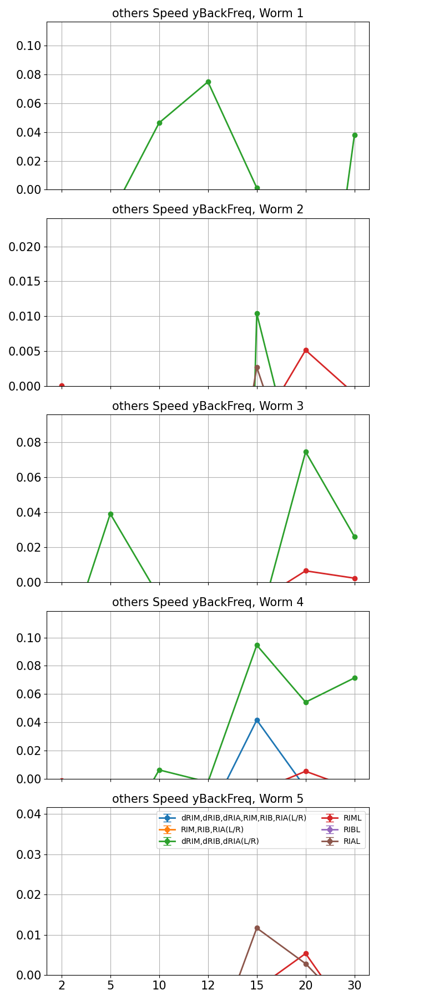

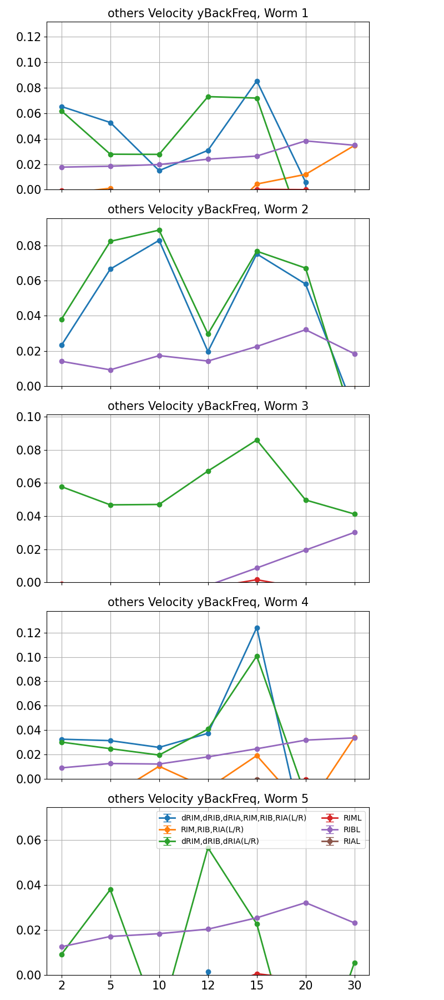

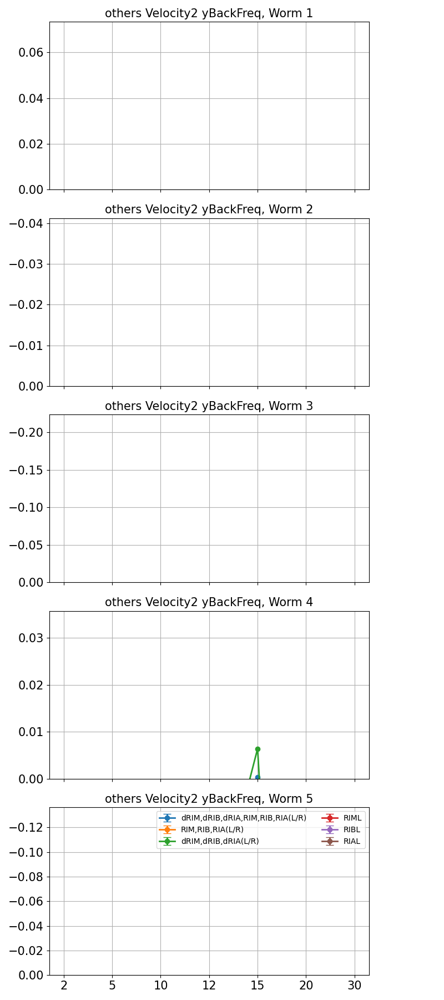

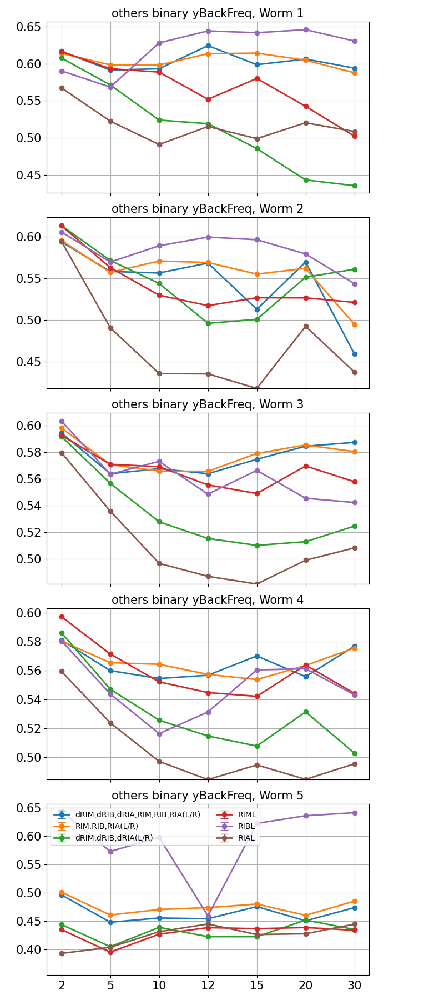

In [83]:
Set = dep0 + 'BackFreq'
fig = plot_each_wormRsqr(y_labels , countbin0 ,Rsquare_acrossBins_others_av[:,:,:,0],Rsquare_acrossBins_others_std[:,:,:,0],neulabel_list,
                   a_range = alist,titre='others Speed '+Set+', Worm ')

fig = plot_each_wormRsqr(y_labels , countbin0 ,Rsquare_acrossBins_others_av[:,:,:,1],Rsquare_acrossBins_others_std[:,:,:,1],neulabel_list,
                   a_range = alist,titre='others Velocity '+Set+', Worm ')

fig = plot_each_wormRsqr(y_labels , countbin0 ,Rsquare_acrossBins_others_av[:,:,:,2],Rsquare_acrossBins_others_std[:,:,:,2],neulabel_list,
                   a_range = alist,titre='others Velocity2 '+Set+', Worm ')

fig = plot_each_wormRsqr(y_labels , countbin0 ,Rsquare_acrossBins_others_av[:,:,:,3],Rsquare_acrossBins_others_std[:,:,:,3],neulabel_list,
                   a_range = alist,titre='others binary '+Set+', Worm ')

### Plot the average R² values for predicting speed, velocity, and binary movement state — using the test set for the A2 case and the training set for the A1 case — from the same worm.

/var/folders/j_/xp76mh010877vv3jqz9hq7740000gn/T/ipykernel_92755/4110462111.py:14: RuntimeWarning: invalid value encountered in divide
  row_sems = row_sems0/np.sqrt(np.sum(~(row_sems0==0)))


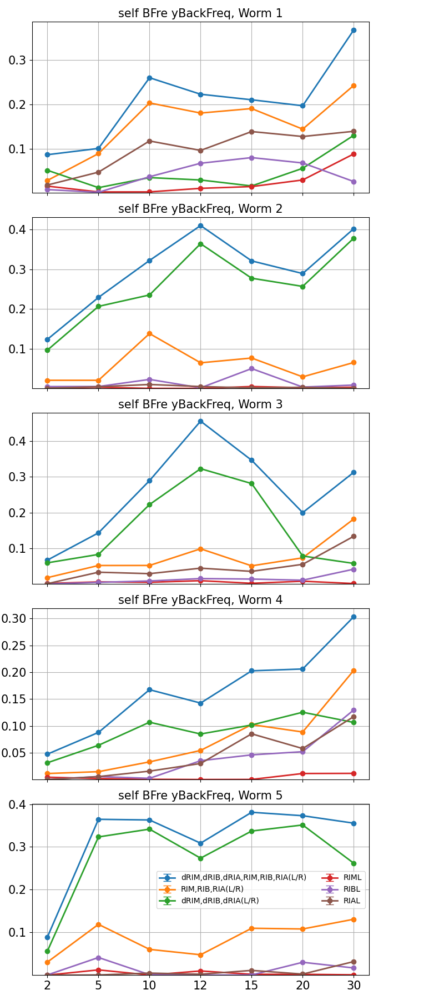

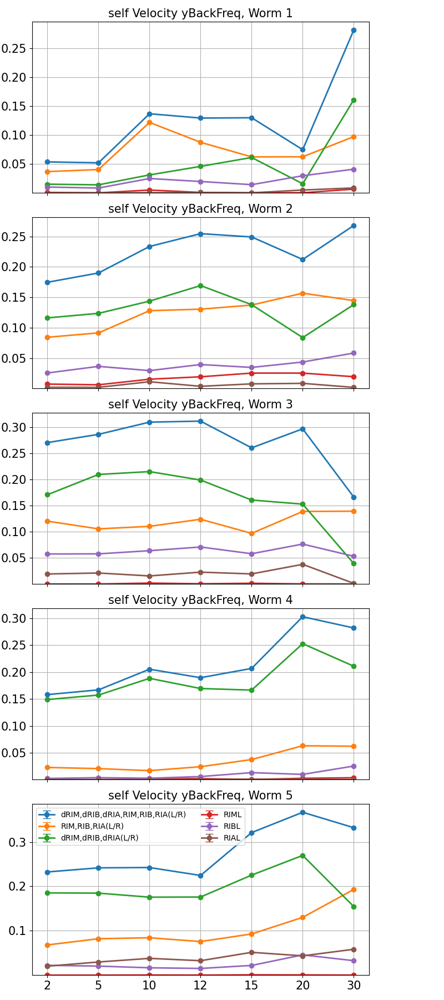

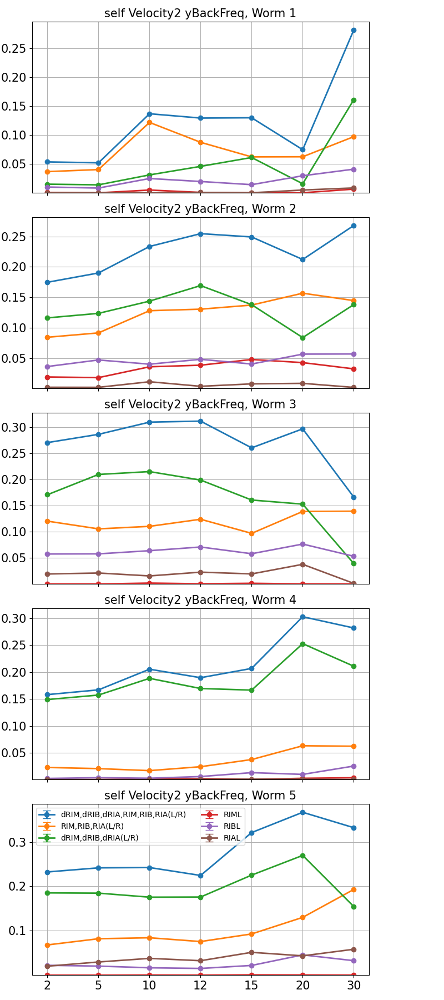

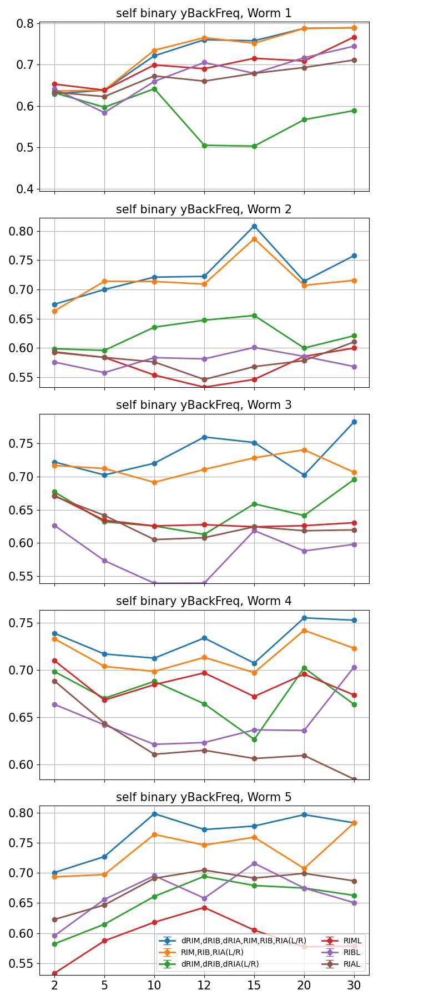

In [84]:
fig1 = plot_each_wormRsqr(y_labels , countbin0 ,Rsquare_acrossBins_self_av[:,:,:,0],Rsquare_acrossBins_self_std[:,:,:,0],neulabel_list,
                   a_range = alist,titre='self BFre '+Set+', Worm ')

fig2 = plot_each_wormRsqr(y_labels , countbin0 ,Rsquare_acrossBins_self_av[:,:,:,1],Rsquare_acrossBins_self_std[:,:,:,1],neulabel_list,
                   a_range = alist,titre='self Velocity '+Set+', Worm ')

fig3 = plot_each_wormRsqr(y_labels , countbin0 ,Rsquare_acrossBins_self_av[:,:,:,2],Rsquare_acrossBins_self_std[:,:,:,2],neulabel_list,
                   a_range = alist,titre='self Velocity2 '+Set+', Worm ')

fig4 = plot_each_wormRsqr(y_labels , countbin0 ,Rsquare_acrossBins_self_av[:,:,:,3],Rsquare_acrossBins_self_std[:,:,:,3],neulabel_list,
                   a_range = alist,titre='self binary '+Set+', Worm ')
fig1.savefig(f"{outDir}SelfSpeed_Train{Train}_IndWorm_{Set}.png", dpi=res, bbox_inches='tight')
fig2.savefig(f"{outDir}SelfVelocity1_Train{Train}_IndWorm_{Set}.png", dpi=res, bbox_inches='tight')
fig3.savefig(f"{outDir}SelfVelocity2_Train{Train}_IndWorm_{Set}.png", dpi=res, bbox_inches='tight')
fig4.savefig(f"{outDir}SelfBinary_Train{Train}_IndWorm_{Set}.png", dpi=res, bbox_inches='tight')

### Plot the average R² values for predicting speed, velocity, and binary movement state — using the test set for the A2 case and the training set for the A1 case — on all the worms.

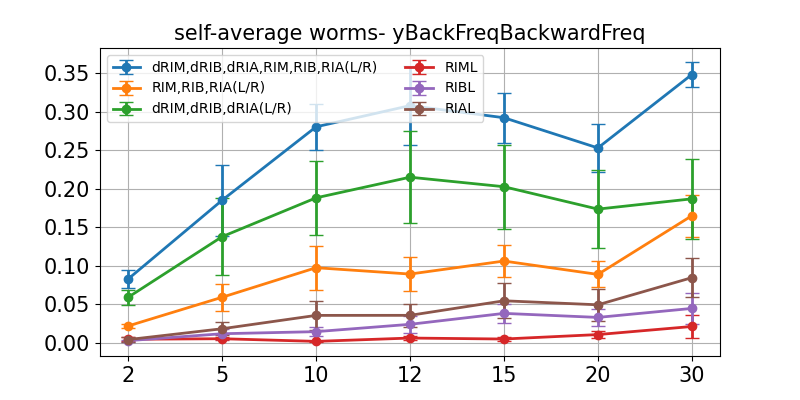

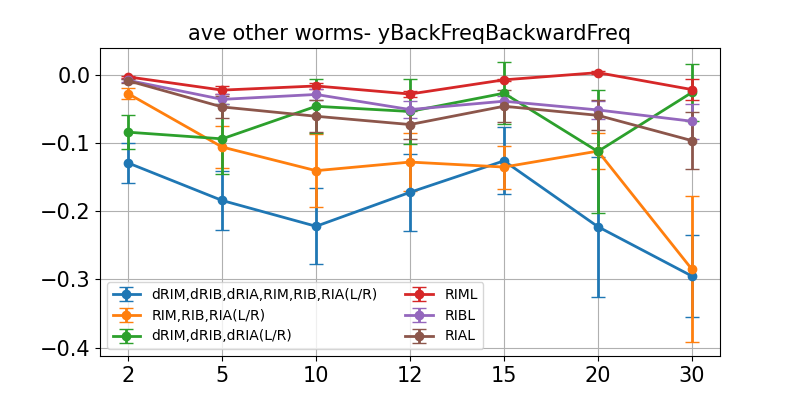

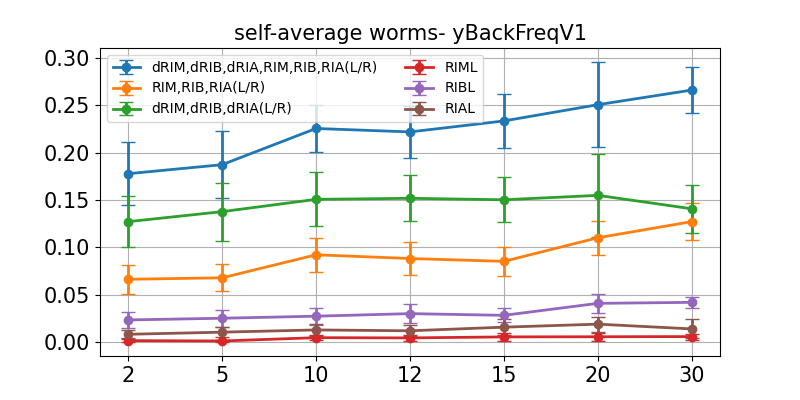

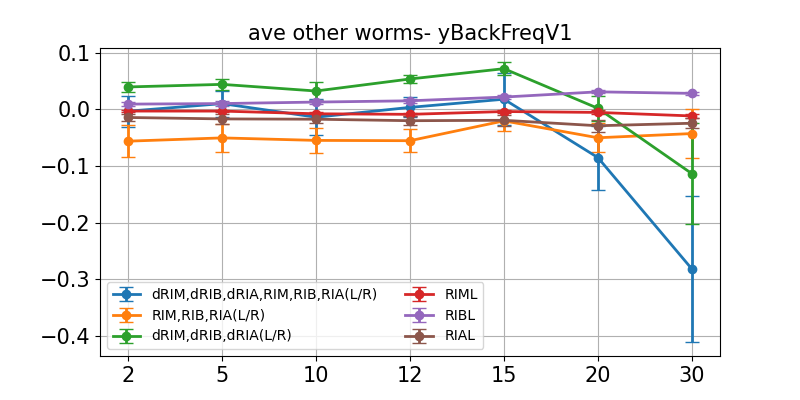

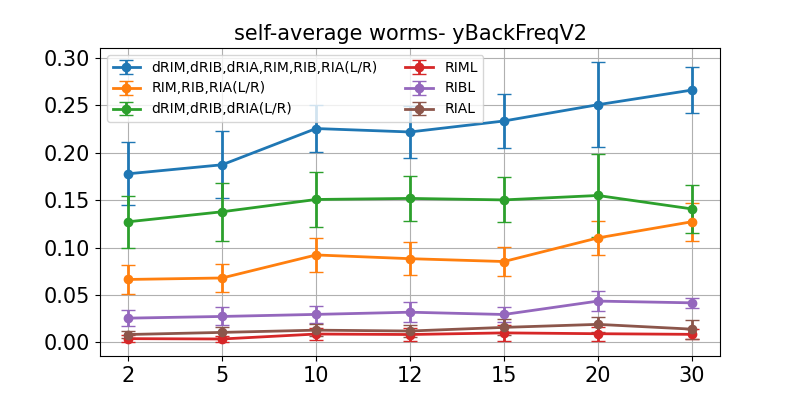

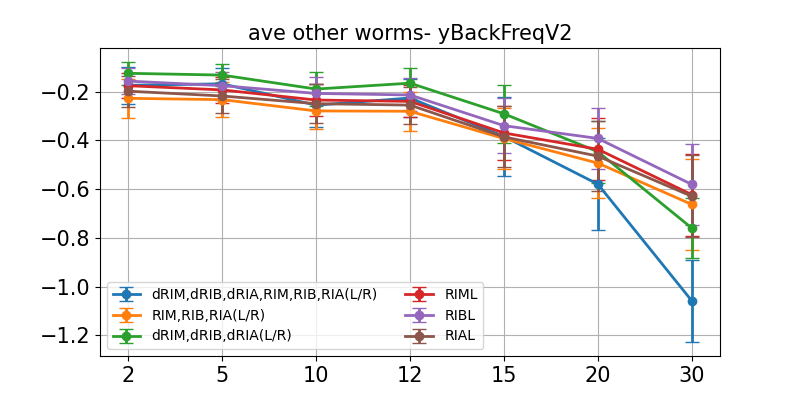

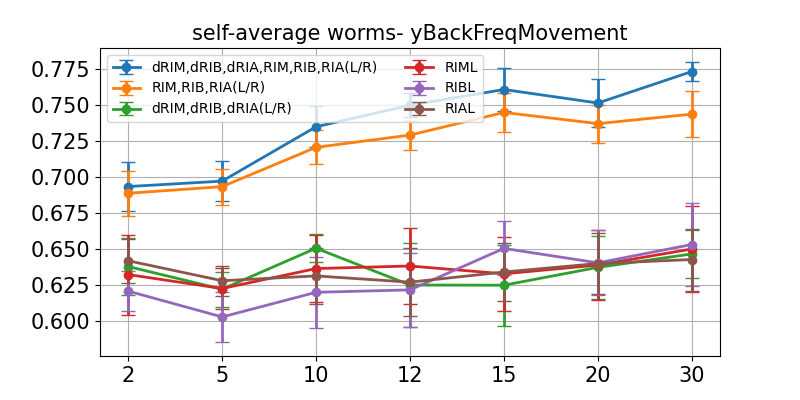

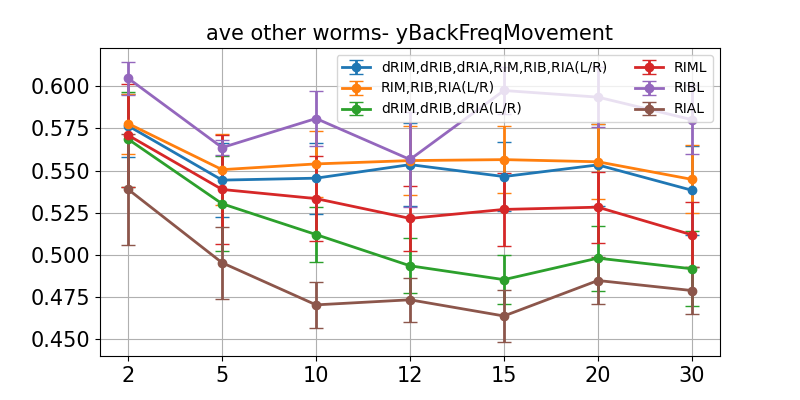

In [85]:
beh = ['BackwardFreq', 'V1', 'V2', 'Movement']
for br in range(4):
    fig1Ave = plot_averagedWorm_acrossbins(y_labels,countbin0, Rsquare_acrossBins_self_av[:,:,:,br],neulabel_list, 
                             a_range = alist,titre='self-average worms- '+Set+beh[br])
    #plot_averagedWorm_acrossbins(y_labels,countbin,Rsquare_acrossBins_self_max[:,:,:,br],indextV_all, 
    #                         a_range = range(7),titre='Max worms- '+beh[br])
    #plot_averagedWorm_acrossbins(y_labels,countbin,Rsquare_acrossBins_others_max[:,:,:,br],indextV_all, 
    #                         a_range = range(7),titre='Max other worms- '+beh[br])
    fig4Ave = plot_averagedWorm_acrossbins(y_labels,countbin0,Rsquare_acrossBins_others_av[:,:,:,br],neulabel_list, 
                             a_range = alist,titre='ave other worms- '+Set+beh[br])
    fig1Ave.savefig(f"{outDir}SelfAve_{beh[br]}_Train{Train}_{Set}.png", dpi=res, bbox_inches='tight')
    fig4Ave.savefig(f"{outDir}OtherAve_{beh[br]}_Train{Train}_{Set}.png", dpi=res, bbox_inches='tight')


### ploting the average coefficients

/var/folders/j_/xp76mh010877vv3jqz9hq7740000gn/T/ipykernel_92755/4110462111.py:3: RuntimeWarning: invalid value encountered in divide
  output = matrix / np.abs(matrix).max(axis=1, keepdims=True)
/var/folders/j_/xp76mh010877vv3jqz9hq7740000gn/T/ipykernel_92755/4110462111.py:60: RuntimeWarning: Mean of empty slice
  Coeff_m = np.nanmean(normalize_coeff(Coeff_others_av[b,a,:,:lp]),axis=0)
/var/folders/j_/xp76mh010877vv3jqz9hq7740000gn/T/ipykernel_92755/4110462111.py:79: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


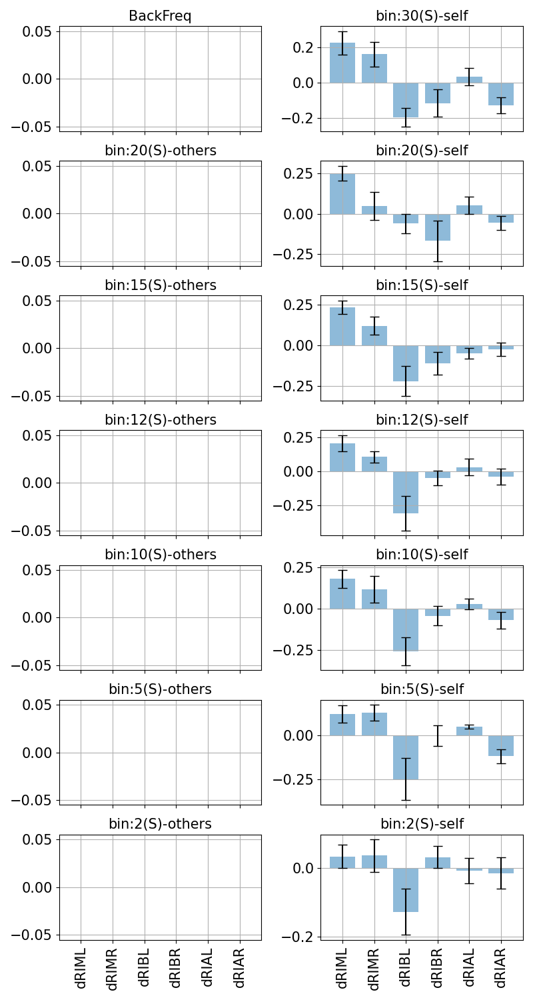

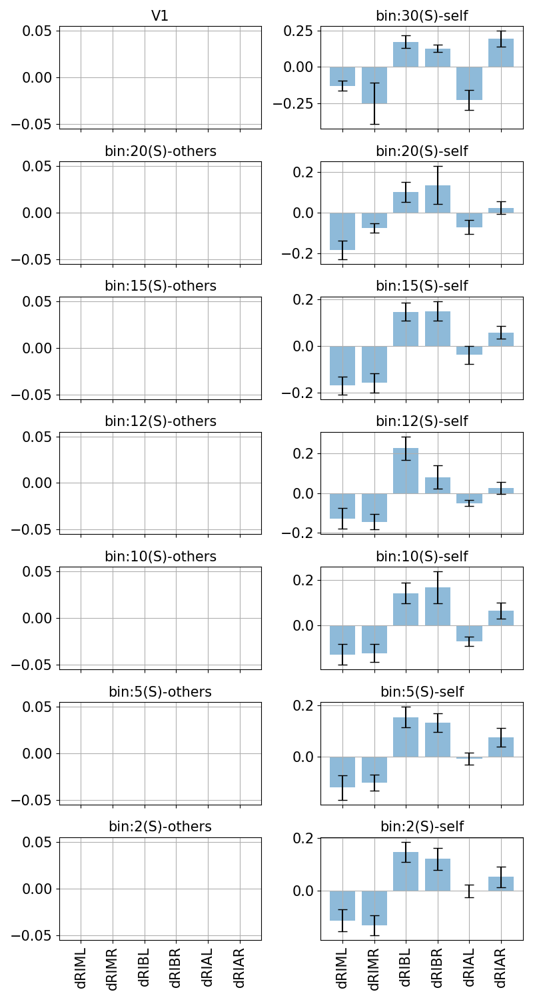

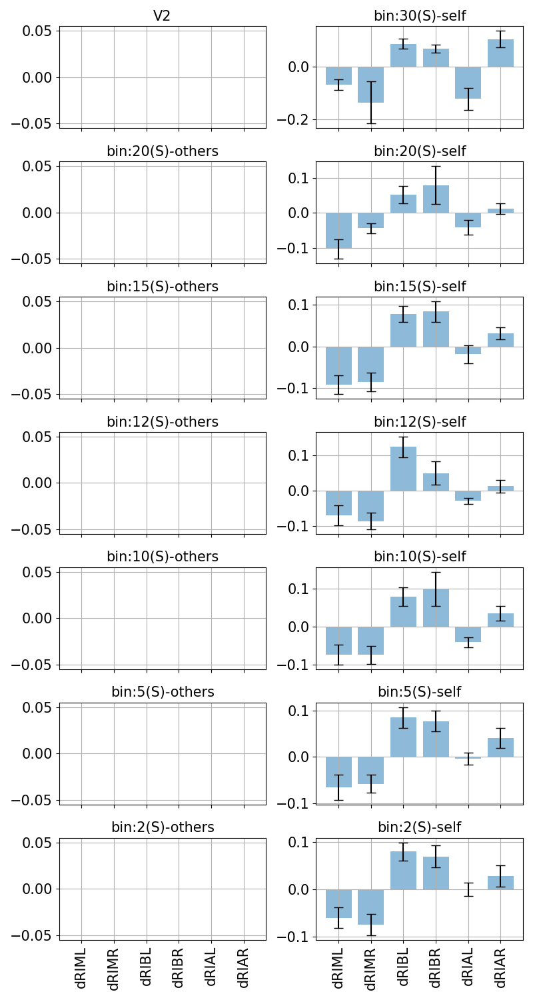

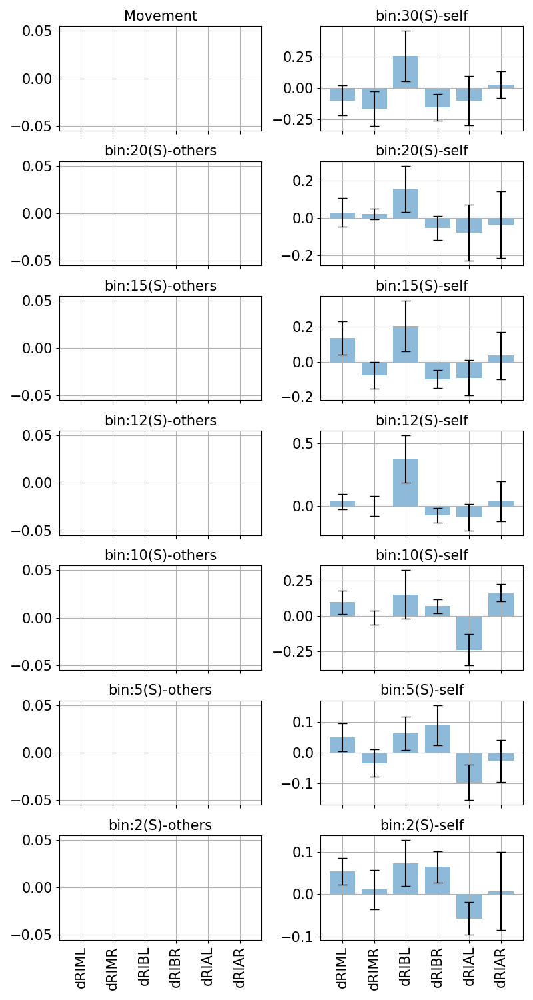

In [88]:
a0 = 2# you want coefficients for which linear regression model?
beh = ['BackFreq', 'V1', 'V2', 'Movement']

if a0==0:
    coefflist0 = ['dRIML','dRIMR','RIML','RIMR','RIBL','RIBR','dRIBL','dRIBR','RIAL','RIAR','dRIAL','dRIAR']
if a0==1:
    coefflist0 = ['RIML','RIMR','RIBL','RIBR','RIAL','RIAR']
if a0==2:
    coefflist0 = ['dRIML','dRIMR','dRIBL','dRIBR','dRIAL','dRIAR']
for br in range(4):
    coefflist = copy.deepcopy(coefflist0)
    fig = plot_coefficients(y_labels,countbin0,Coeff_acrossBins_others_av[:,:,:,:,br],Coeff_acrossBins_self_av[:,:,:,:,br],
                  coefflist,a=a0,behave=beh[br])
    fig.savefig(f"{outDir}Coeff_{beh[br]}_Train{Train}_{Set}_a{a0}.png", dpi=res, bbox_inches='tight')

/tmp/ipykernel_1649355/3908746329.py:3: RuntimeWarning: invalid value encountered in true_divide
  output = matrix / np.abs(matrix).max(axis=1, keepdims=True)
/tmp/ipykernel_1649355/3908746329.py:58: RuntimeWarning: Mean of empty slice
  Coeff_m = np.nanmean(normalize_coeff(Coeff_others_av[b,a,:,:lp]),axis=0)


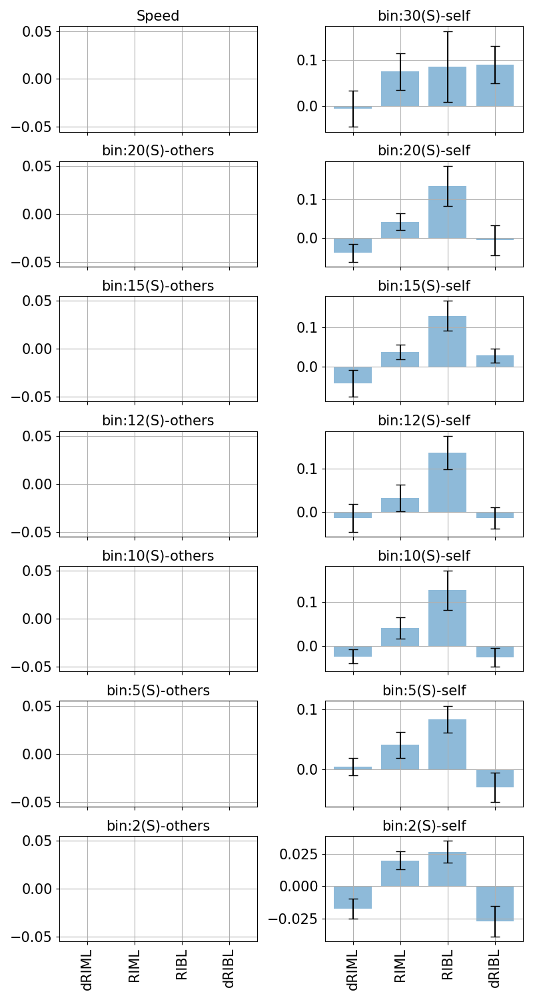

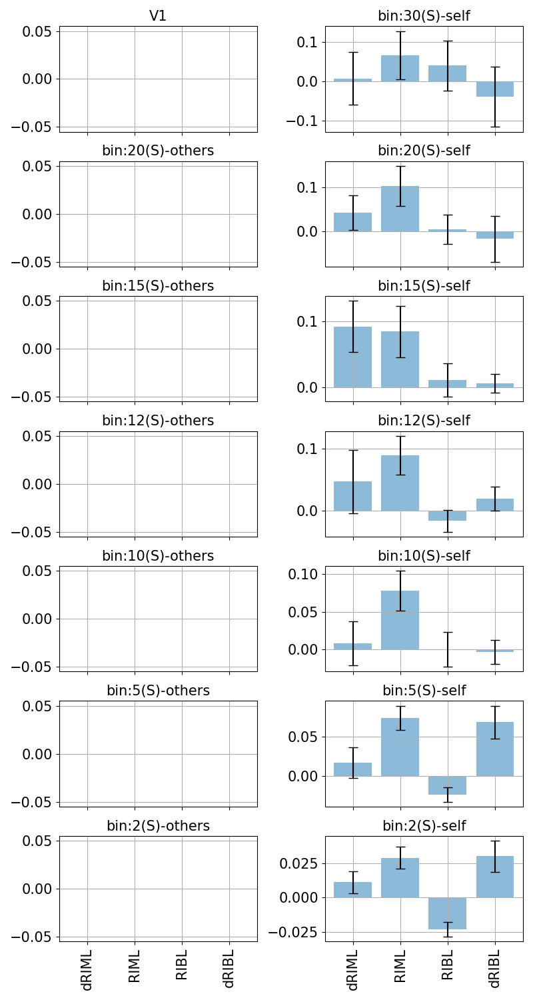

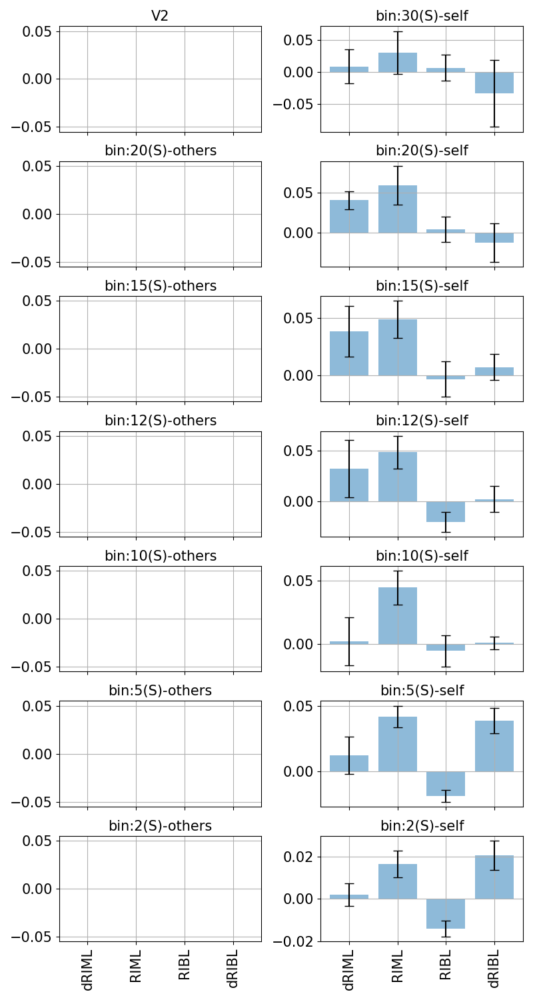

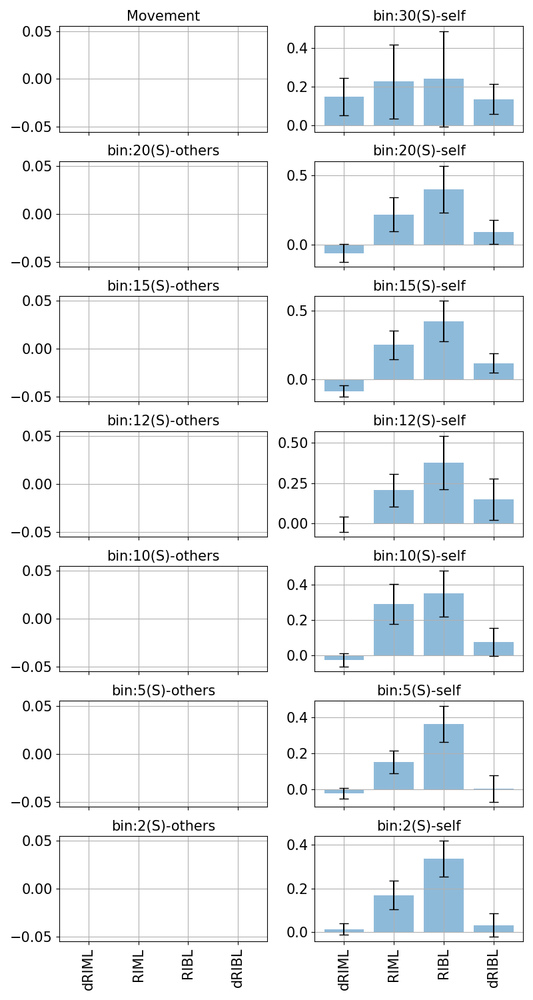

In [43]:
for br in range(4):
    plot_coefficients(y_labels,countbin0,Coeff_acrossBins_others_av[:,:,:,:,br],Coeff_acrossBins_self_av[:,:,:,:,br],
                  ['dRIML','RIML','RIBL','dRIBL'],a=5,behave=beh[br])

/tmp/ipykernel_1649355/3908746329.py:3: RuntimeWarning: invalid value encountered in true_divide
  output = matrix / np.abs(matrix).max(axis=1, keepdims=True)
/tmp/ipykernel_1649355/3908746329.py:58: RuntimeWarning: Mean of empty slice
  Coeff_m = np.nanmean(normalize_coeff(Coeff_others_av[b,a,:,:lp]),axis=0)


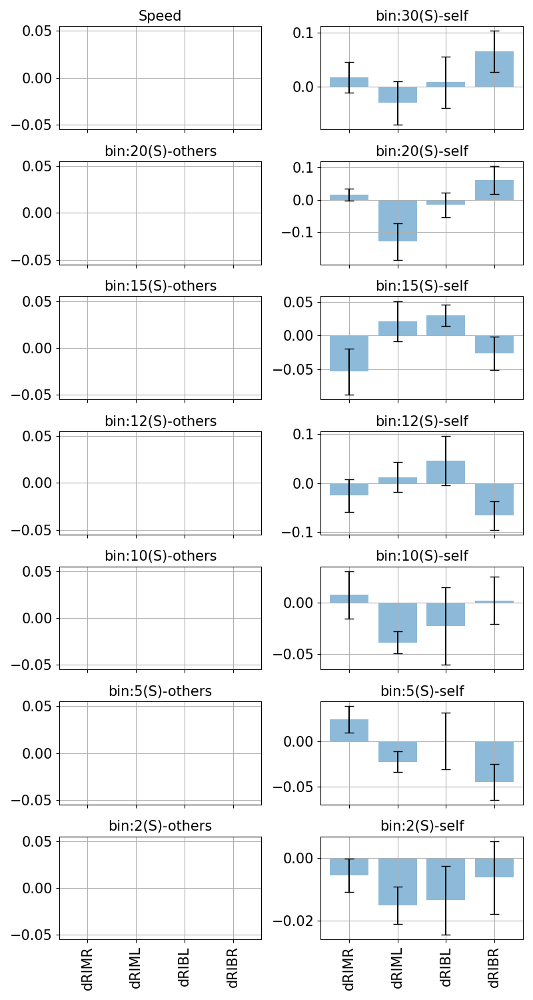

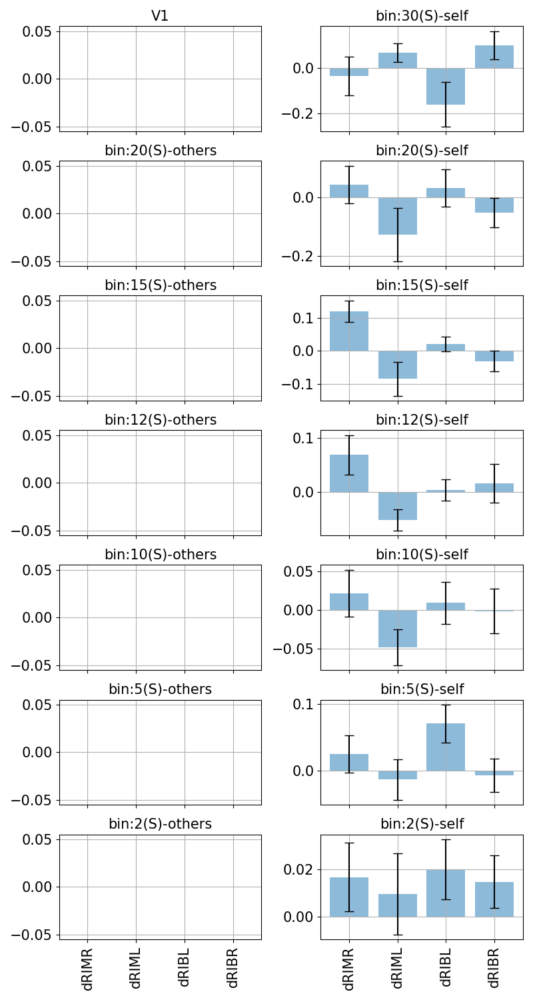

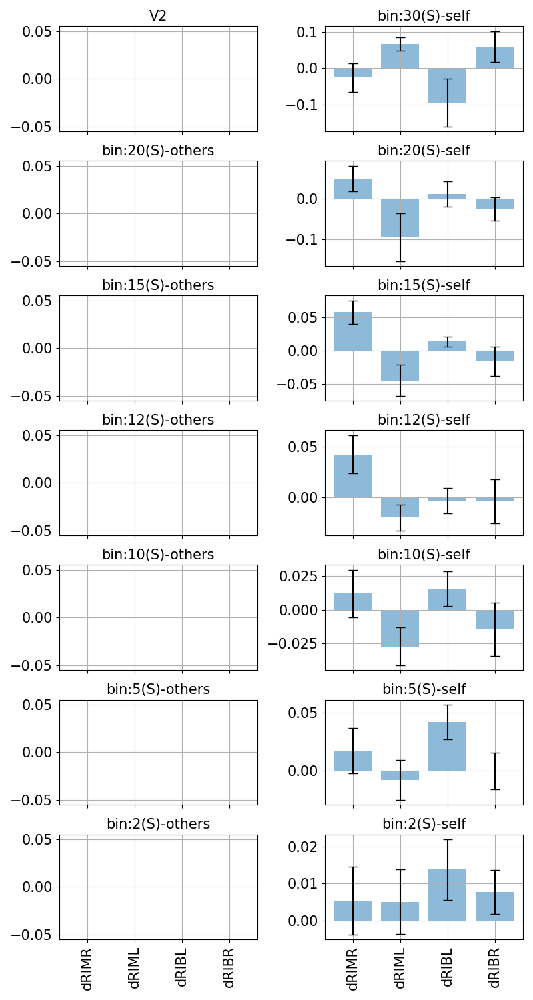

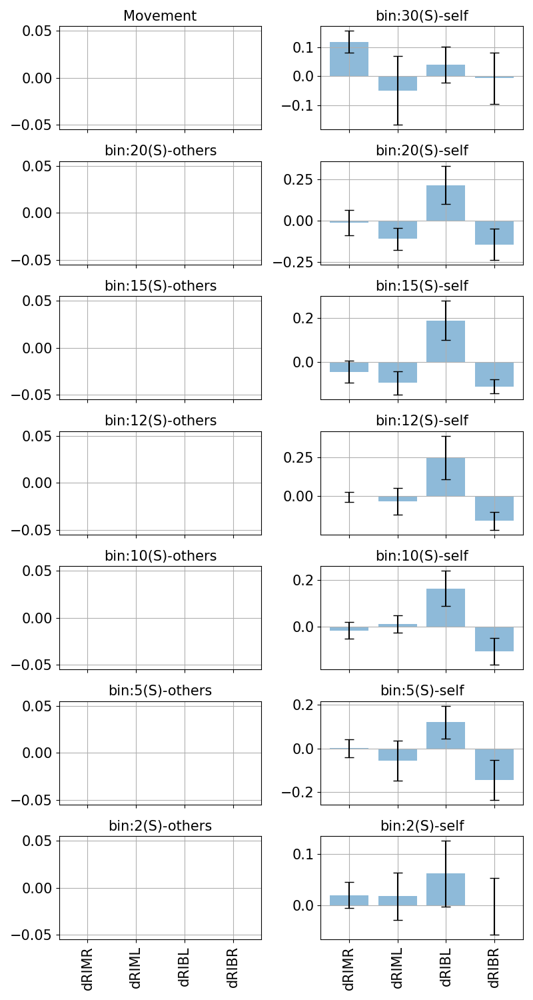

In [44]:
for br in range(4):
    plot_coefficients(y_labels,countbin0,Coeff_acrossBins_others_av[:,:,:,:,br],Coeff_acrossBins_self_av[:,:,:,:,br],
                  ['dRIMR','dRIML','dRIBL','dRIBR'],a=2,behave=beh[br])

/tmp/ipykernel_1649355/3908746329.py:3: RuntimeWarning: invalid value encountered in true_divide
  output = matrix / np.abs(matrix).max(axis=1, keepdims=True)
/tmp/ipykernel_1649355/3908746329.py:58: RuntimeWarning: Mean of empty slice
  Coeff_m = np.nanmean(normalize_coeff(Coeff_others_av[b,a,:,:lp]),axis=0)


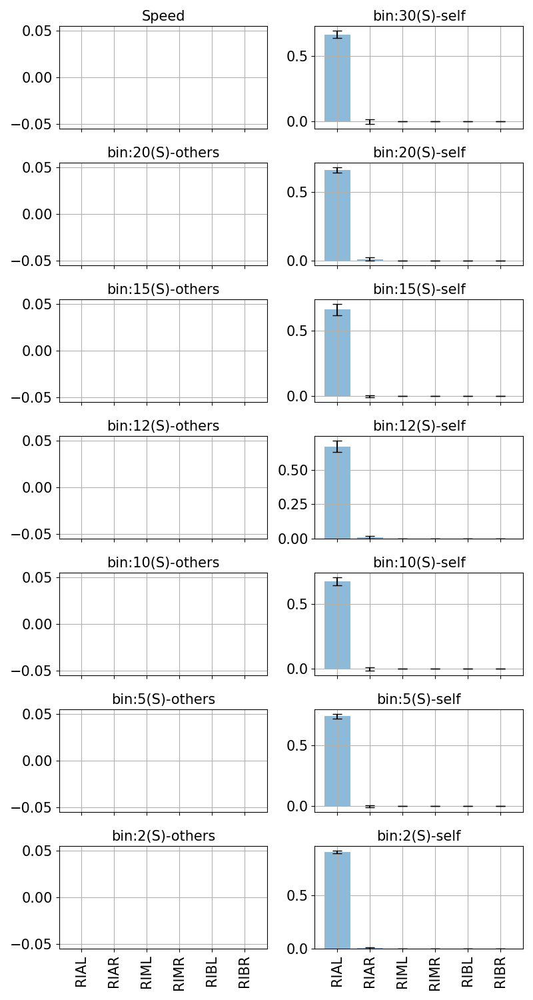

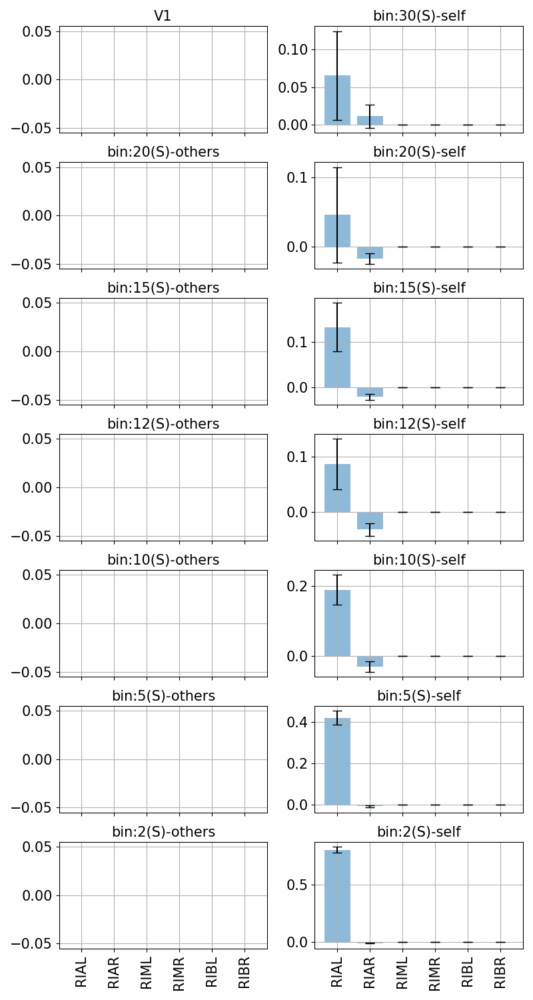

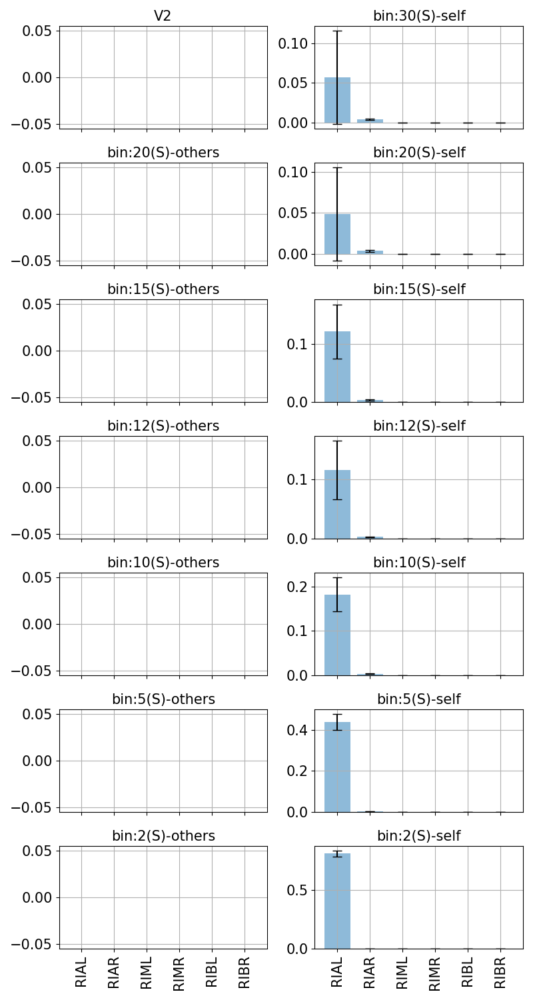

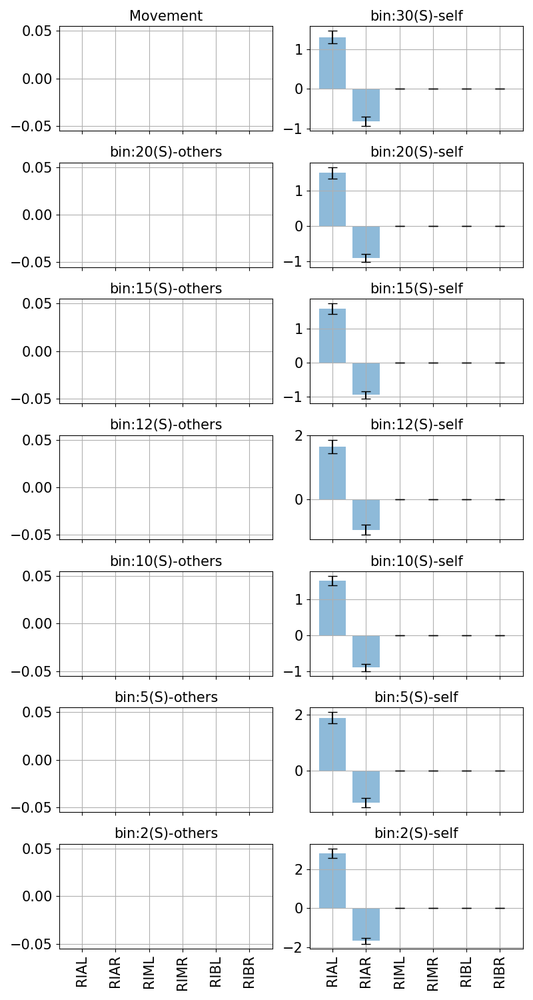

In [45]:
for br in range(4):
    plot_coefficients(y_labels,countbin0,Coeff_acrossBins_others_av[:,:,:,:,br],Coeff_acrossBins_self_av[:,:,:,:,br],
                  ['RIAL','RIAR','RIML','RIMR','RIBL','RIBR'],a=-1,behave=beh[br])

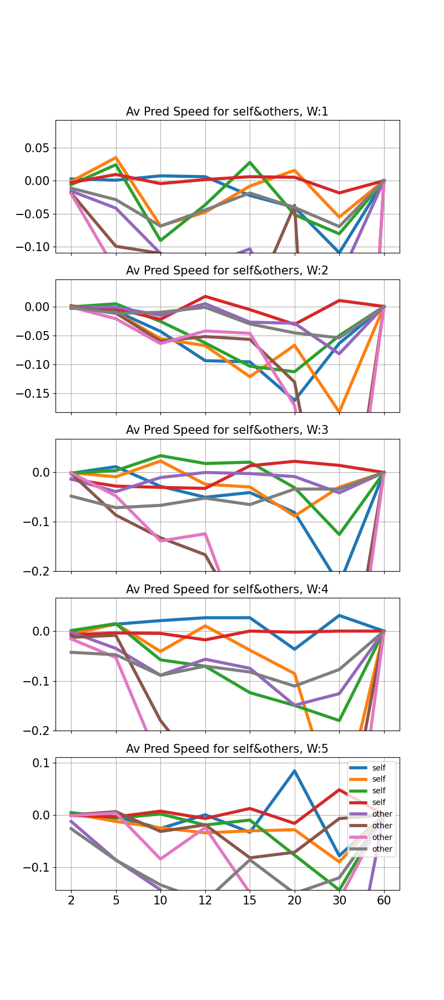

In [83]:
#check neuron predictability
fs=15
rows = y_labels[1:]
fig, axes = plt.subplots(nrows=numW, ncols=1, figsize=(8, 4*numW-2), sharex=True)
for d in range(numW):
    ax=axes[d]
    row_meansMax2 = pred_self_av[1:,d]
    rowpred = pred_others_av[1:,d]
    ax.plot(rows, row_meansMax2,lw=4,label='self')#,label='others',lw=2)
    ax.plot(rows, rowpred,lw=4,label='other')
    ax.set_xticks(rows,labels=y_labels[1:],fontsize=fs)  # Set custom x labels with font size
    ax.tick_params(axis='y', labelsize=fs) 
    # Customize the plot
    ax.set_ylim(bottom = np.max([-0.2,np.min(row_meansMax2)]))

    ax.set_title('Av Pred Speed for self&others, W:'+str(d+1), fontsize=fs)
    ax.grid(True)
    ax.invert_xaxis() 
ax.legend()
plt.show()

In [27]:
List = index_list[0]
param = [x for x in index_list[0]]

param.append('Const')

/tmp/ipykernel_1670814/1242972689.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(8, 15), sharex=True)


TypeError: only size-1 arrays can be converted to Python scalars

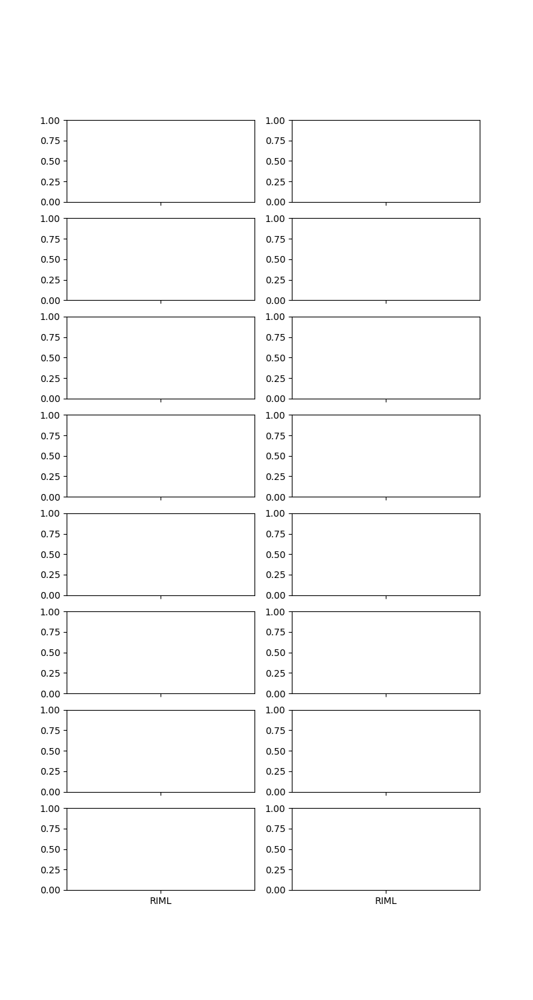

In [28]:
List = index_list[0]
#param0 = ['dRIMR','dRIML','RIML','RIMR','RIBL','RIBR','dRIBL','dRIBR']#[x for x in index_list[0]]
param0 = ['dRIMR','dRIML','RIML','RIMR','RIBL','RIBR','dRIBL','dRIBR']
#param = param0[::2]
param = ['RIML','RIMR','RIBL','RIBR']
lp=len(param)
param.append('Const')
rows = param[:lp]
fs=15
a=1
fig, axes = plt.subplots(nrows=8, ncols=2, figsize=(8, 15), sharex=True)
for b in range(1,9):
    ax= axes[b-1,0]
    Coeff_m = (Coeff_pred_others_max[b,d,:lp])    
    Coeff_self_m = (Coeff_pred_self_max[b,d,:lp])
    axes[b-1,0].bar(param[:lp], Coeff_m,label='others',alpha=0.5)
    axes[b-1,1].bar(param[:lp], Coeff_self_m,label='self',alpha=0.5)
    axes[b-1,0].set_xticks(rows,labels=param[:lp],fontsize=fs,rotation = 90)  # Set custom x labels with font size
    axes[b-1,0].tick_params(axis='y', labelsize=fs) 
    axes[b-1,1].set_xticks(rows,labels=param[:lp],fontsize=fs,rotation = 90)  # Set custom x labels with font size
    axes[b-1,1].tick_params(axis='y', labelsize=fs) 
    #ax.set_yticks(fontsize=fs)
    # Customize the plot
    #plt.ylim(bottom = np.max([-0.2,np.min(row_meansMax2)]))

    axes[b-1,0].set_title('bin:'+y_labels[b]+'(S)-self', fontsize=fs)
    axes[b-1,1].set_title('bin:'+y_labels[b]+'(S)-others', fontsize=fs)
    #plt.title("Mean Values with Error Bars", fontsize=fs)
    #ax.legend()
    axes[b-1,1].grid(True)
    axes[b-1,0].grid(True)
    # Adjust layout to prevent overlap
    plt.tight_layout()
plt.show()


## 5) Plot prediction of the model trained on one worm for behavior of other worms.

In [53]:
I =1#which indext to use which set of independent variables
# which coeff to choose 
lp = len(index_list[I])+1
Bin_choice = 4
Odplot=False

In [54]:


binList = list(Bins_difftime.keys())
binListFinal = binList
m= bin_coeff[Bin_choice]
b = [int(32*m),int(50*m),int(50*m),int(50*m),int(47*m),int(53*m),int(44*m)]
bin_s = binListFinal[Bin_choice]
bin_size = bin_s
print(bin_s)

bin_15


In [55]:
Bins_difftime[bin_size]
activity_bins = Bins_difftime[bin_size]['activity']
speed_bins = Bins_difftime[bin_size]['Speed']
time_bins = Bins_difftime[bin_size]['time']
Velocity_bins = Bins_difftime[bin_size]['Velocity']
odor_bins = Bins_difftime[bin_size]['Odor']
width_bins = Bins_difftime[bin_size]['width']
highspeed_bins = Bins_difftime[bin_size]['highspeed']
behavior_bins = speed_bins #Velocity_bins# highspeed_bins#BackwardFreq_bins + ForwardFreq_bins#
bchoice = 0#0:speed,1:v1
dataAll_1 = MPB.make_Dataset_ZscoreAll(activity_bins,time_bins,behavior_bins,odor_bins,b,except_data=[100],bins=True,sm=sm)

filtered_dataAll1= MPB.Dataset_filtered_0andNans(dataAll_1,nonzero_columns=[ 'x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'y','y_sh','y_sh2'],exceptional2=True)
keys_to_include = ['data1', 'data3', 'data4', 'data5', 'data6']
filtered_data_dict = {key: filtered_dataAll1[key] for key in keys_to_include}
filtered_dataAll= copy.deepcopy(filtered_data_dict)


#Coeff = Coeff_acrossBins_others_max[Bin_choice,I,:,:lp,bchoice]#Coeff_acrossBins_self_av[b,I,d,:lp]
Coeff = Coeff_acrossBins_self_av[Bin_choice,I,:,:lp,bchoice]
Rsq_plot = Rsquare_acrossBins_others_av[Bin_choice,I,:numW]#which R2 to report [b,a,:numW]

************d6


In [56]:
Coeff_acrossBins_self_av.shape

(9, 21, 5, 13, 4)

In [57]:
print(index_list[I])

Index(['x2', 'x3', 'x4', 'x5', 'x27', 'x28'], dtype='object')


In [58]:
Odplot=0#True

Index(['x2', 'x3', 'x4', 'x5', 'x27', 'x28'], dtype='object')
(164, 6)


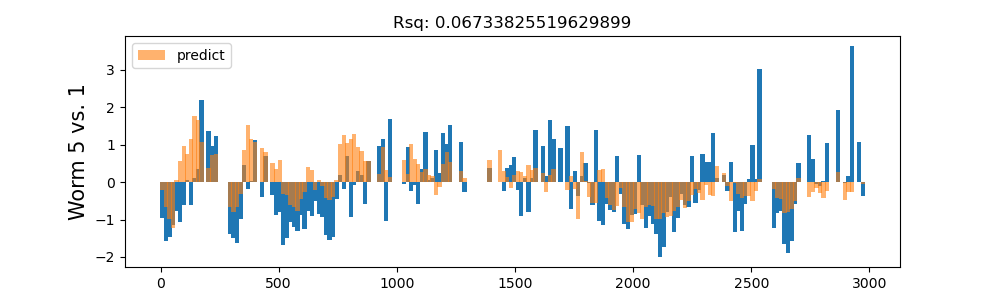

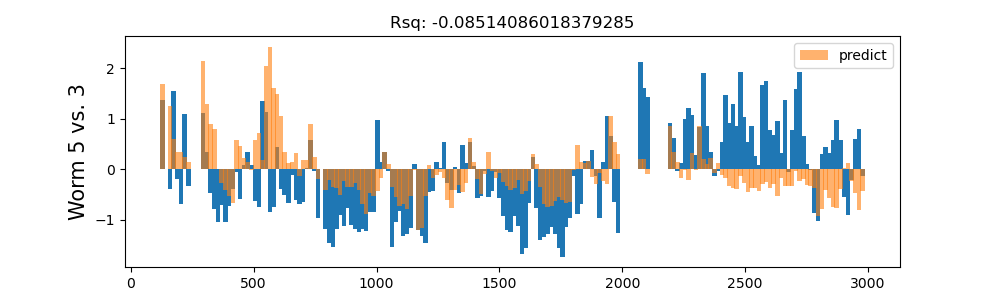

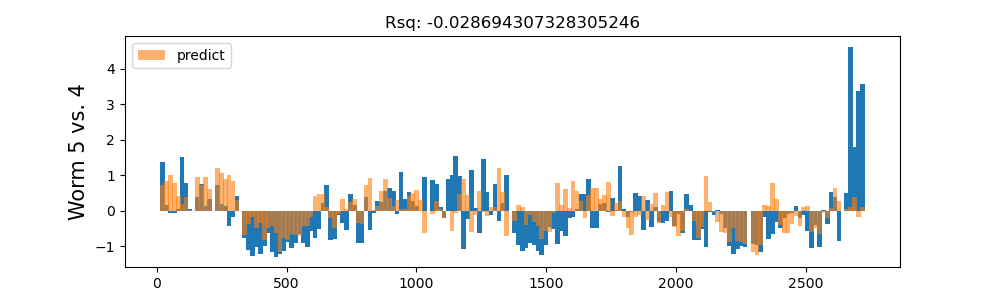

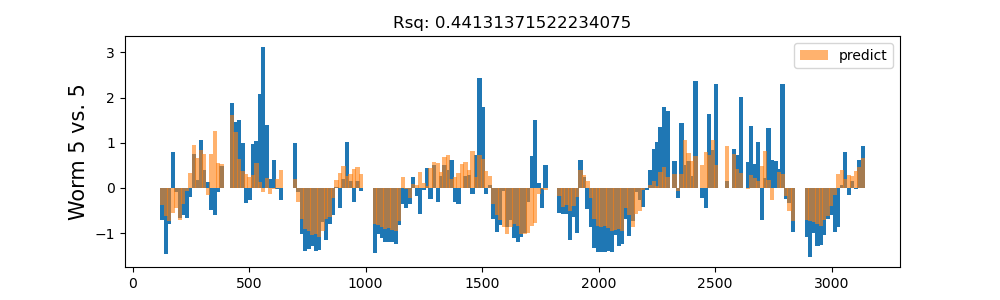

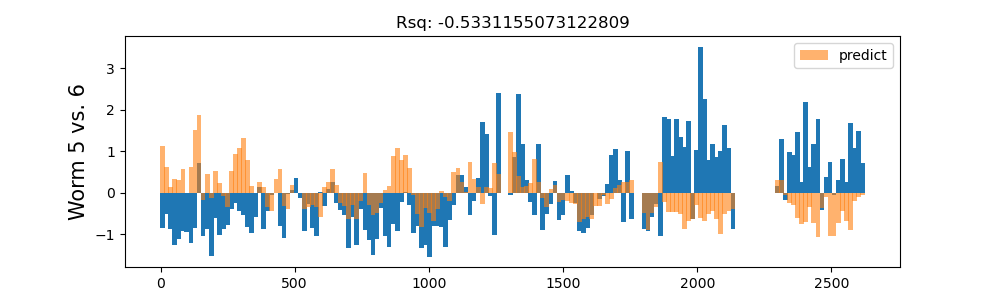

In [59]:
#plot linear regressions prediction with the mean of the trials
m=3#linear regression of the worm chosen
if m>0:
    worm = str(m+2)
if m==0:
    worm = str(m + 1)
data = filtered_dataAll['data1']
print(index_list[I])
%matplotlib widget
XX = np.array(data[index_list[I]])
print(np.shape(XX))

yhat = Rss.Regress_with_coeff(XX,Coeff[m,:])
yhat[np.isnan(yhat)]=0
y = [float(g) for g in np.array(data[['y']])]

RE =  Rss.compute_r_squared(y, yhat)
mE = Rss.mean_squared_error(yhat, y)
time0 =[float(g) for g in np.array(data[['time']])]
odors = [float(g) for g in np.array(data[['Odor']])]
title = 'Worm '+ worm +' vs. 1'
Rss.plot_2BarsBars(y,yhat,time0,RE,title,mE,w=width_bins[1,1],od=Odplot,odorbin=odors)


data = filtered_dataAll['data3']

XX = np.array(data[index_list[I]])
yhat = Rss.Regress_with_coeff(XX,Coeff[m,:])
yhat[np.isnan(yhat)]=0
y = [float(g) for g in np.array(data[['y']])]
RE =  Rss.compute_r_squared(y, yhat)
RE2 = mean_squared_error(yhat, y)
time0 =[float(g) for g in np.array(data[['time']])]
odors = [float(g) for g in np.array(data[['Odor']])]
title = 'Worm '+ worm +' vs. 3'
Rss.plot_2BarsBars(y,yhat,time0,RE,title,mE,w=width_bins[3,1],od=Odplot,odorbin=odors)

data = filtered_dataAll['data4']

XX = np.array(data[index_list[I]])
yhat = Rss.Regress_with_coeff(XX,Coeff[m,:])
yhat[np.isnan(yhat)]=0
y = [float(g) for g in np.array(data[['y']])]
RE =  Rss.compute_r_squared(y, yhat)
mE = mean_squared_error(yhat, y)
time0 =[float(g) for g in np.array(data[['time']])]
odors = [float(g) for g in np.array(data[['Odor']])]
title = 'Worm '+ worm +' vs. 4'
Rss.plot_2BarsBars(y,yhat,time0,RE,title,mE,w=width_bins[4,1],od=Odplot,odorbin=odors)

data = filtered_dataAll['data5']

XX = np.array(data[index_list[I]])
yhat = Rss.Regress_with_coeff(XX,Coeff[m,:])
yhat[np.isnan(yhat)]=0
y = [float(g) for g in np.array(data[['y']])]
odors = [float(g) for g in np.array(data[['Odor']])]
RE = Rss.compute_r_squared(y, yhat)
mE = mean_squared_error(yhat, y)
time0 =[float(g) for g in np.array(data[['time']])]
title = 'Worm '+ worm +' vs. 5'
Rss.plot_2BarsBars(y,yhat,time0,RE,title,mE,w=width_bins[5,1],od=Odplot,odorbin=odors)

data = filtered_dataAll['data6']
%matplotlib widget
XX = np.array(data[index_list[I]])
yhat = Rss.Regress_with_coeff(XX,Coeff[m,:])
yhat[np.isnan(yhat)]=0
odors = [float(g) for g in np.array(data[['Odor']])]
y = [float(g) for g in np.array(data[['y']])]
RE =  Rss.compute_r_squared(y, yhat)
mE = mean_squared_error(yhat, y)
title = 'Worm '+ worm +' vs. 6'
time0 =[float(g) for g in np.array(data[['time']])]
Rss.plot_2BarsBars(y,yhat,time0,RE,title,mE,w=width_bins[6,1],od=Odplot,odorbin=odors)